In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import mobilenet_v2
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import itertools
import os

class InvertedResidual(nn.Module):
    def __init__(self, inp, oup, stride, expand_ratio):
        super(InvertedResidual, self).__init__()
        self.stride = stride
        assert stride in [1, 2]
        hidden_dim = int(inp * expand_ratio)
        self.use_res_connect = self.stride == 1 and inp == oup

        layers = []
        if expand_ratio != 1:
            layers.append(nn.Conv2d(inp, hidden_dim, 1, 1, 0, bias=False))
            layers.append(nn.BatchNorm2d(hidden_dim))
            layers.append(nn.ReLU6(inplace=True))

        layers.extend([
            nn.Conv2d(hidden_dim, hidden_dim, 3, stride, 1, groups=hidden_dim, bias=False),
            nn.BatchNorm2d(hidden_dim),
            nn.ReLU6(inplace=True),
            nn.Conv2d(hidden_dim, oup, 1, 1, 0, bias=False),
            nn.BatchNorm2d(oup),
        ])

        self.conv = nn.Sequential(*layers)

    def forward(self, x):
        if self.use_res_connect:
            return x + self.conv(x)
        else:
            return self.conv(x)


class ContinuousAtrousConvModule(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ContinuousAtrousConvModule, self).__init__()
        middle_channels = out_channels // 3
        self.atrous_conv1 = nn.Conv2d(in_channels, middle_channels, kernel_size=3, dilation=1, padding=1)
        self.atrous_conv2 = nn.Conv2d(in_channels, middle_channels, kernel_size=3, dilation=2, padding=2)
        self.atrous_conv3 = nn.Conv2d(in_channels, out_channels - 2 * middle_channels, kernel_size=3, dilation=4, padding=4)
        self.relu = nn.ReLU(inplace=True)
        self.bn = nn.BatchNorm2d(out_channels)
        #self.global_pool = nn.AdaptiveAvgPool2d((1, 1))

    def forward(self, x):
        x1 = self.atrous_conv1(x)
        x2 = self.atrous_conv2(x)
        x3 = self.atrous_conv3(x)
        x = torch.cat([x1, x2, x3], dim=1)
        x = self.bn(x)
        x = self.relu(x)
        #x = self.global_pool(x)
        return x


class ImprovedSkipLayer(nn.Module):
    def __init__(self, low_level_channels, mid_level_channels, high_level_channels, num_classes):
        super(ImprovedSkipLayer, self).__init__()
        self.conv_low = nn.Conv2d(low_level_channels, num_classes, kernel_size=1)
        self.conv_mid = nn.Conv2d(mid_level_channels, num_classes, kernel_size=1)
        self.conv_high = nn.Conv2d(high_level_channels, num_classes, kernel_size=1)

    def forward(self, x_low, x_mid, x_high, x_upsampled):
        x_low_processed = self.conv_low(x_low)
        x_mid_processed = self.conv_mid(x_mid)
        x_high_processed = self.conv_high(x_high)

        x_upsampled_8x = F.interpolate(x_upsampled, size=x_high_processed.shape[2:], mode='bilinear', align_corners=False)
        high_fusion = x_high_processed + x_upsampled_8x

        high_fusion_upsampled = F.interpolate(high_fusion, size=x_mid_processed.shape[2:], mode='bilinear', align_corners=False)
        mid_fusion = x_mid_processed + high_fusion_upsampled

        mid_fusion_upsampled = F.interpolate(mid_fusion, size=x_low_processed.shape[2:], mode='bilinear', align_corners=False)
        final_fusion = x_low_processed + mid_fusion_upsampled

        output = F.interpolate(final_fusion, size=(640, 640), mode='bilinear', align_corners=False)
        return output


class ImprovedFCN_MobileNetV2(nn.Module):
    def __init__(self, num_classes=7):
        super(ImprovedFCN_MobileNetV2, self).__init__()
        mobilenet = mobilenet_v2(pretrained=True)

        self.low_level_features = nn.Sequential(
            mobilenet.features[0],
            mobilenet.features[1],
        )

        self.mid_level_features = nn.Sequential(
            mobilenet.features[2],
            mobilenet.features[3],
        )

        self.high_level_features = nn.Sequential(
            mobilenet.features[4],
            mobilenet.features[5],
            mobilenet.features[6],
            mobilenet.features[7],
            mobilenet.features[8],
            mobilenet.features[9],
            mobilenet.features[10],
        )

        self.deeper_features = nn.Sequential(
            mobilenet.features[11],
            mobilenet.features[12],
            mobilenet.features[13],
            mobilenet.features[14],
            mobilenet.features[15],
            mobilenet.features[16],
            mobilenet.features[17],
        )

        self.channel_expansion = nn.Conv2d(320, 1024, kernel_size=1, bias=False)
        self.bn_expansion = nn.BatchNorm2d(1024)
        self.relu_expansion = nn.ReLU6(inplace=True)

        self.continuous_atrous = ContinuousAtrousConvModule(1024, 2048)
        self.final_conv = nn.Conv2d(2048, num_classes, kernel_size=1)

        self.improved_skip = ImprovedSkipLayer(low_level_channels=16, mid_level_channels=24, high_level_channels=64, num_classes=num_classes)
        #self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x_low = self.low_level_features(x)
        x_mid = self.mid_level_features(x_low)
        x_high = self.high_level_features(x_mid)
        x_deep = self.deeper_features(x_high)

        x_expanded = self.relu_expansion(self.bn_expansion(self.channel_expansion(x_deep)))
        x = self.continuous_atrous(x_expanded)
        x = self.final_conv(x)
        x = self.improved_skip(x_low, x_mid, x_high, x)
        #x = self.softmax(x)
        return x
import os
import cv2
import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [2]:
pip install albumentations

Note: you may need to restart the kernel to use updated packages.


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/mode

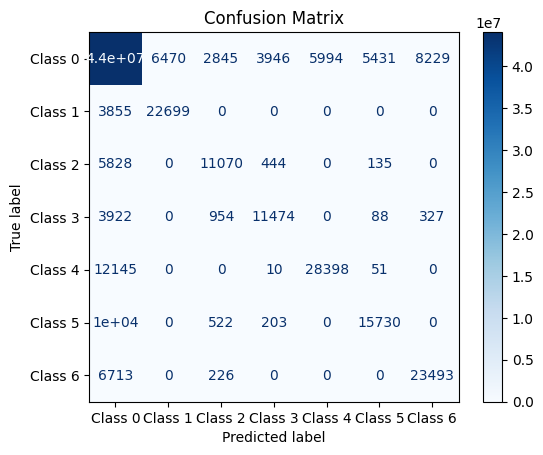

Class 0 Accuracy: 99.93%
Class 1 Accuracy: 85.48%
Class 2 Accuracy: 63.34%
Class 3 Accuracy: 68.44%
Class 4 Accuracy: 69.94%
Class 5 Accuracy: 58.50%
Class 6 Accuracy: 77.20%


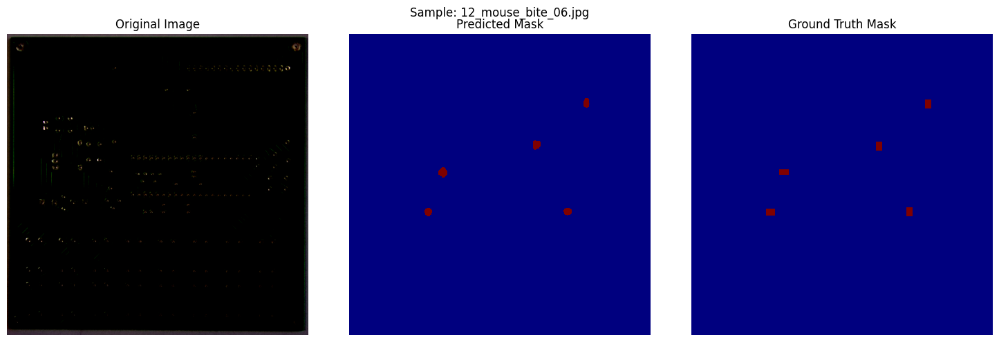

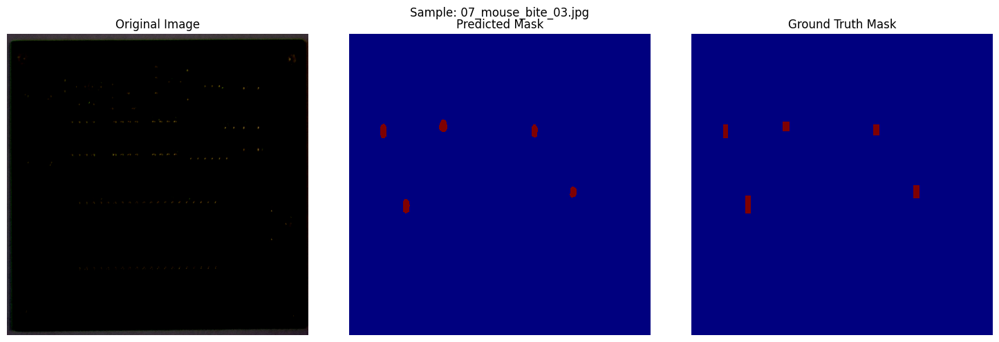

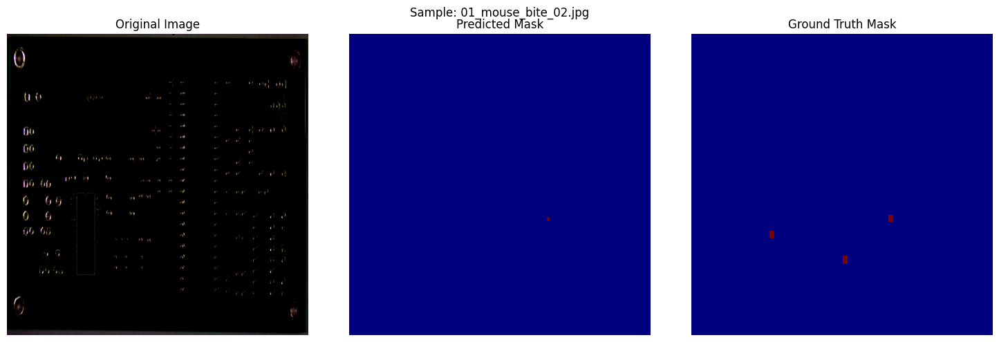

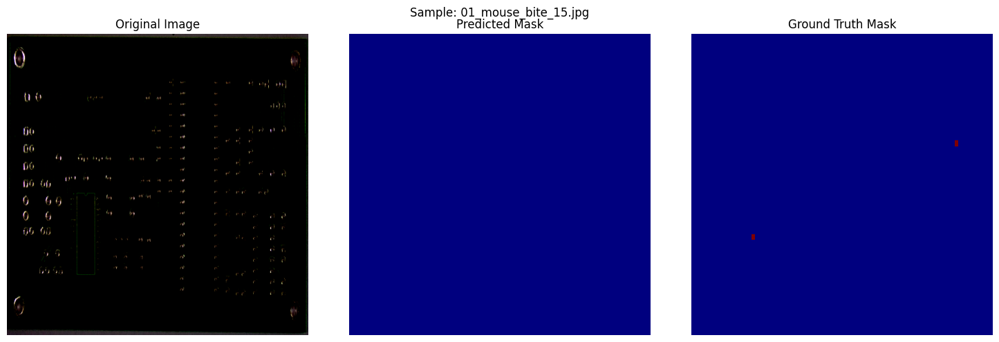

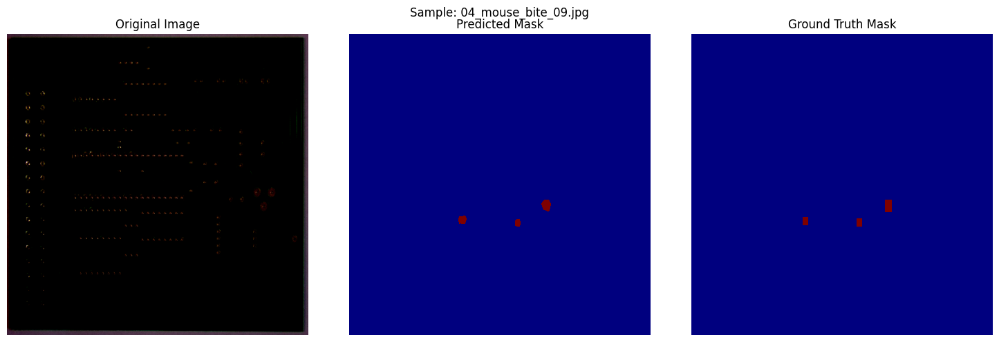

In [3]:
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import albumentations as A
from PIL import Image
import os
from collections import Counter
# -------- Transforms --------
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
import numpy as np
from tqdm import tqdm
class PCBDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.img_paths = []
        self.mask_paths = []
        self.transform = transform

        img_dir = os.path.join(root_dir, 'images')
        mask_dir = os.path.join(root_dir, 'masks')

        for defect_type in os.listdir(img_dir):
            img_type_dir = os.path.join(img_dir, defect_type)
            mask_type_dir = os.path.join(mask_dir, defect_type)

            for fname in os.listdir(img_type_dir):
                img_path = os.path.join(img_type_dir, fname)
                mask_name = fname.replace('.jpg', '.png')
                mask_path = os.path.join(mask_type_dir, mask_name)

                self.img_paths.append(img_path)
                self.mask_paths.append(mask_path)

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        image = np.array(Image.open(self.img_paths[idx]).convert("RGB"))
        mask = np.array(Image.open(self.mask_paths[idx]).convert("L"))

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask'].long()
        else:
            image = transforms.ToTensor()(image)
            mask = torch.from_numpy(mask).long()

        return image, mask, self.img_paths[idx]  # returning image path for visualization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  

model = ImprovedFCN_MobileNetV2(num_classes=num_classes)
model.load_state_dict(torch.load('/kaggle/input/model-pcb/outputs/Model/final_model.pth', map_location=device))
model.to(device)
model.eval()
train_transform = A.Compose([
    A.Resize(640, 640),
    A.HorizontalFlip(p=0.5),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2()
])
test_dataset = PCBDataset("/kaggle/input/split-dataset-pcb-defect/test", transform=train_transform)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)
all_preds = []
all_labels = []

# Store a few samples for visualization
samples = []

with torch.no_grad():
    for images, masks, img_paths in tqdm(test_loader):
        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        all_preds.append(preds.cpu().numpy().flatten())
        all_labels.append(masks.cpu().numpy().flatten())

        # Save first 5 samples for visualization
        if len(samples) < 5:
            samples.append((images[0].cpu().permute(1, 2, 0).numpy(), 
                            preds[0].cpu().numpy(), 
                            masks[0].cpu().numpy(), 
                            os.path.basename(img_paths[0])))

# Flatten for confusion matrix
y_pred = np.concatenate(all_preds)
y_true = np.concatenate(all_labels)

# -------- Confusion Matrix --------
cm = confusion_matrix(y_true, y_pred, labels=list(range(num_classes)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[f'Class {i}' for i in range(num_classes)])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

# -------- Class-wise Accuracy --------
class_accuracy = (cm.diagonal() / cm.sum(axis=1)) * 100
for i, acc in enumerate(class_accuracy):
    print(f"Class {i} Accuracy: {acc:.2f}%")

# -------- Visualization --------
def visualize_sample(original, predicted, ground_truth, title="Sample"):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(original)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    axs[1].imshow(predicted, cmap='jet', interpolation='nearest')
    axs[1].set_title("Predicted Mask")
    axs[1].axis('off')

    axs[2].imshow(ground_truth, cmap='jet', interpolation='nearest')
    axs[2].set_title("Ground Truth Mask")
    axs[2].axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

for idx, (orig, pred, gt, name) in enumerate(samples):
    visualize_sample(orig, pred, gt, title=f"Sample: {name}")

In [4]:
# To show full paths instead of just filenames
for i, path in enumerate(test_dataset.img_paths):
    print(f"{i+1}: {path}")

1: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/12_mouse_bite_06.jpg
2: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/09_mouse_bite_10.jpg
3: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/05_mouse_bite_07.jpg
4: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/06_mouse_bite_02.jpg
5: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/07_mouse_bite_03.jpg
6: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/08_mouse_bite_03.jpg
7: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/11_mouse_bite_06.jpg
8: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/01_mouse_bite_12.jpg
9: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/01_mouse_bite_02.jpg
10: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/01_mouse_bite_04.jpg
11: /kaggle/input/split-dataset-pcb-defect/test/images/Mouse_bite/01_mouse_bite_17.jpg
12: /kaggle/input/split-dataset-pcb-defect/test/imag

  0%|          | 0/27 [00:00<?, ?it/s]


Image: 12_mouse_bite_06.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


/tmp/ipykernel_31/503261589.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('jet', len(class_names))


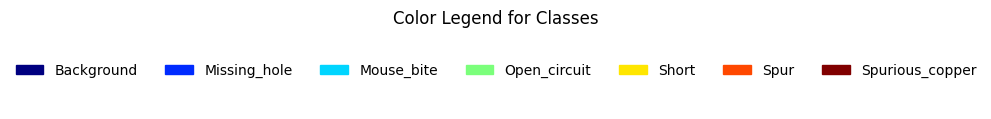

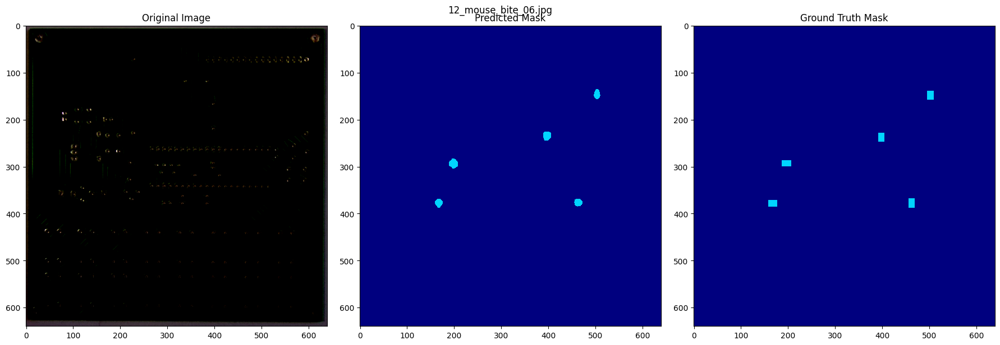


Image: 09_mouse_bite_10.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


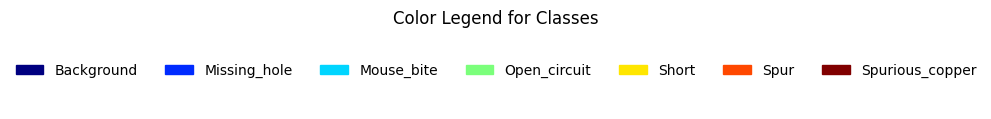

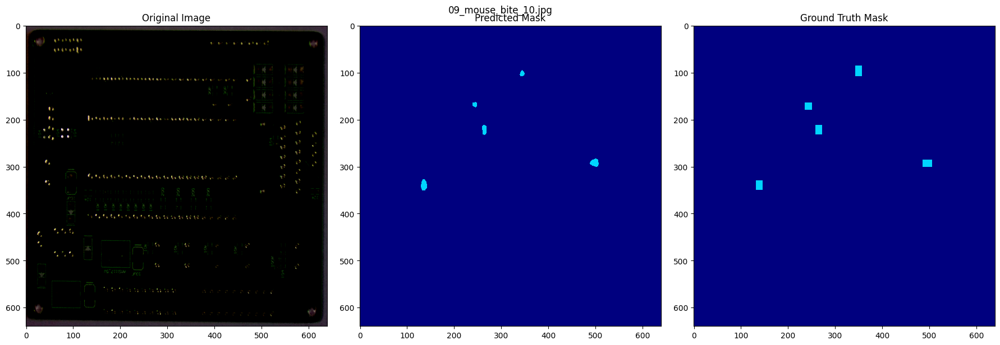


Image: 05_mouse_bite_07.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


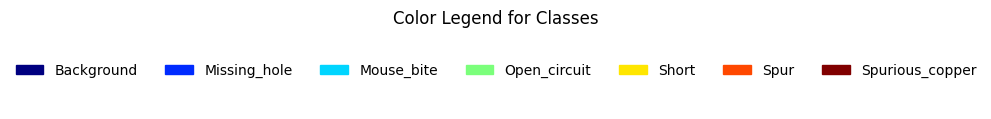

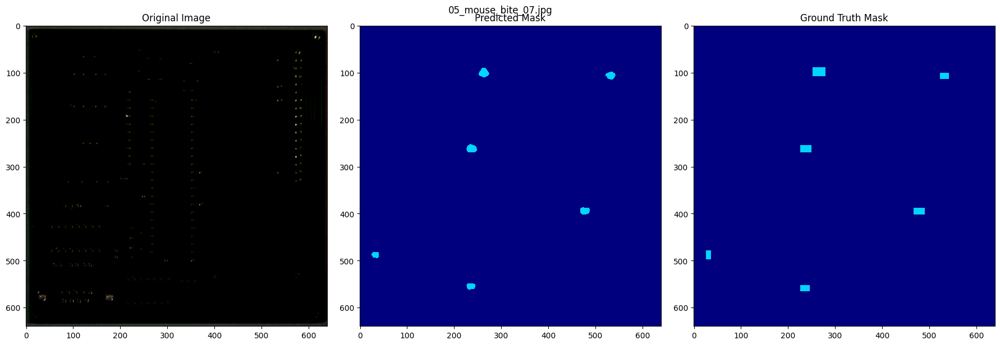


Image: 06_mouse_bite_02.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


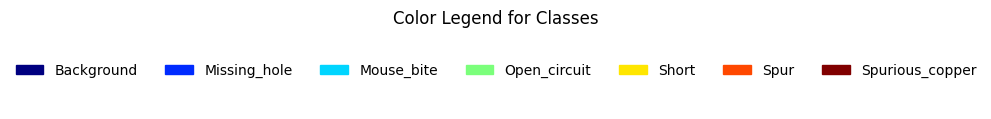

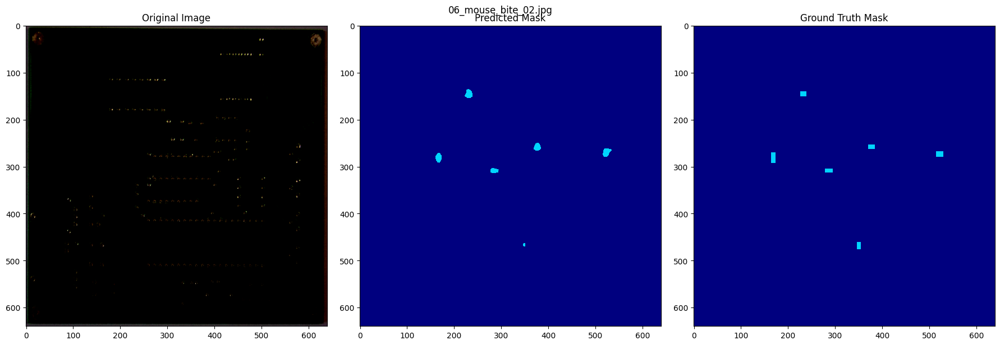

  4%|▎         | 1/27 [00:03<01:27,  3.35s/it]


Image: 07_mouse_bite_03.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


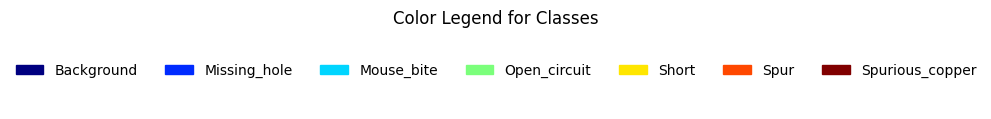

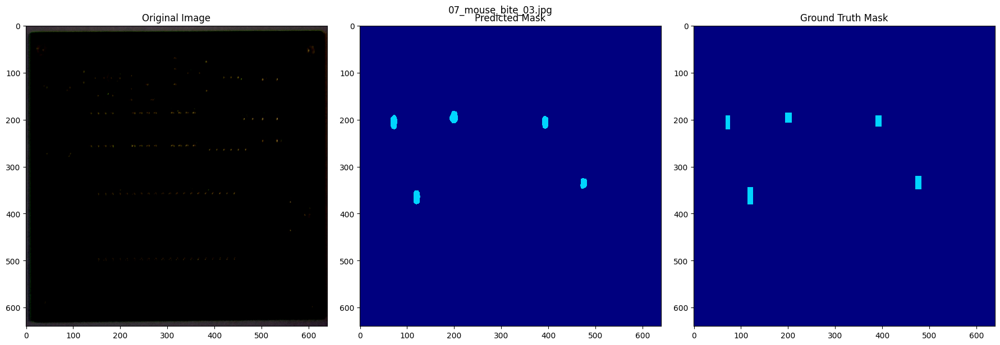


Image: 08_mouse_bite_03.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


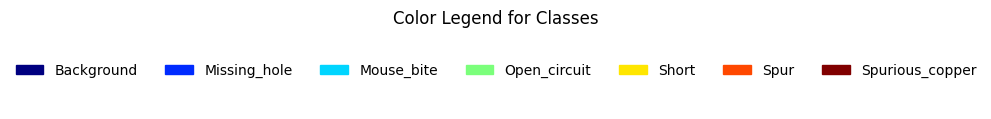

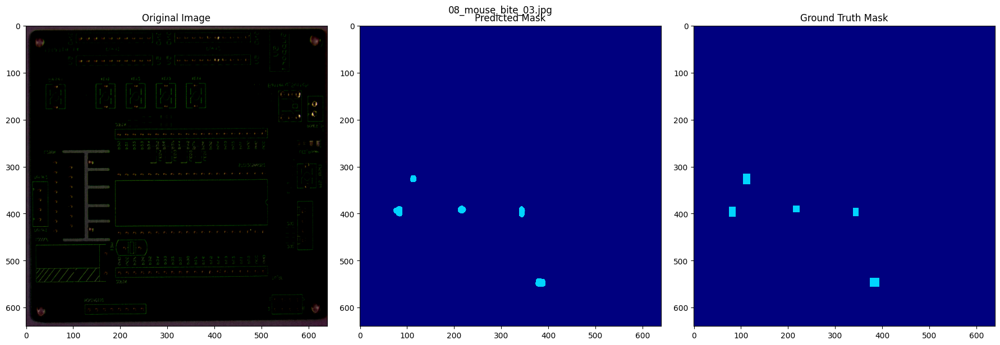


Image: 11_mouse_bite_06.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


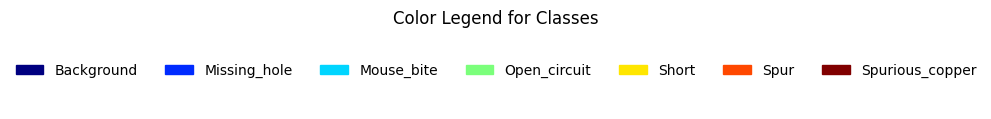

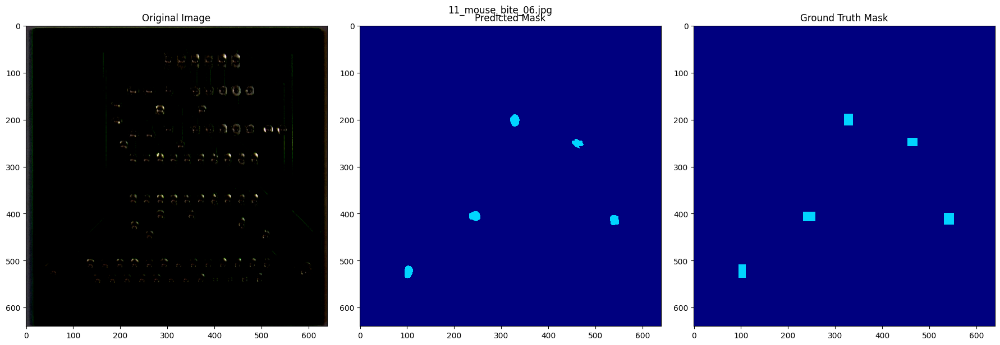


Image: 01_mouse_bite_12.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2 5]


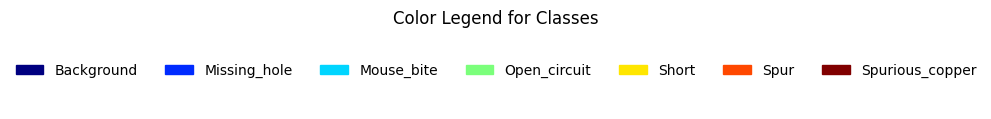

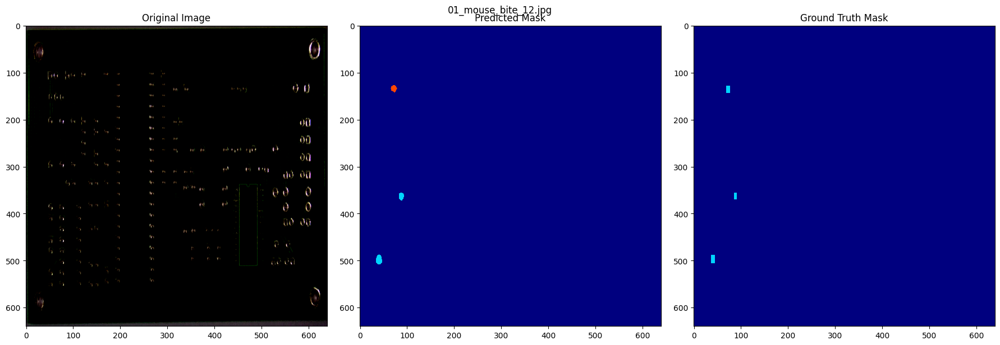

  7%|▋         | 2/27 [00:06<01:25,  3.41s/it]


Image: 01_mouse_bite_02.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 3]


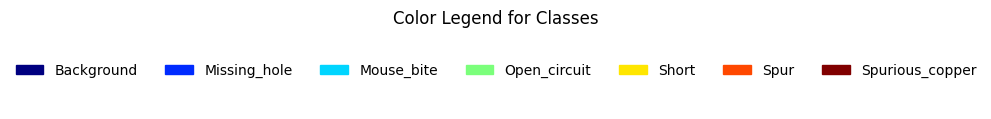

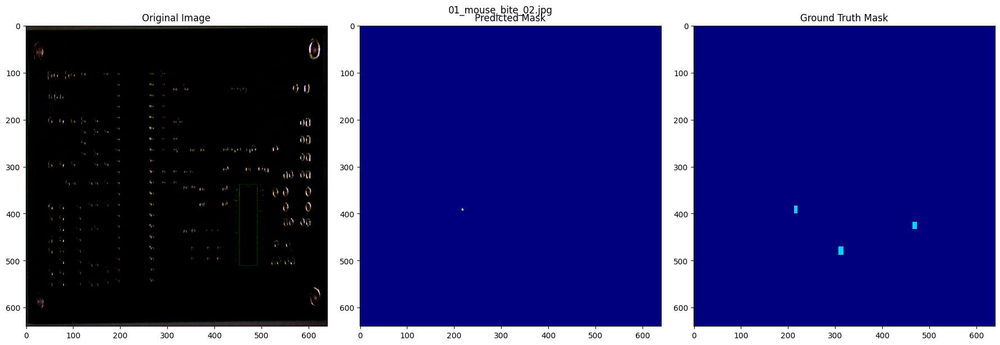


Image: 01_mouse_bite_04.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 5]


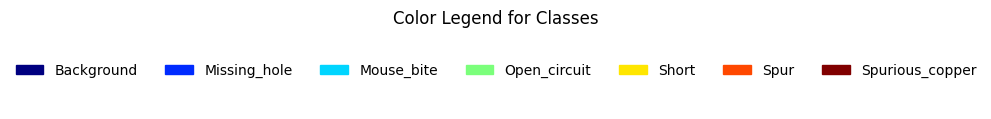

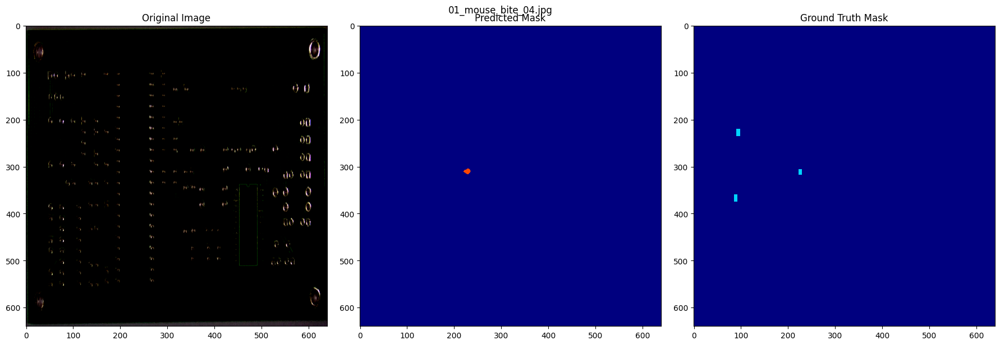


Image: 01_mouse_bite_17.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


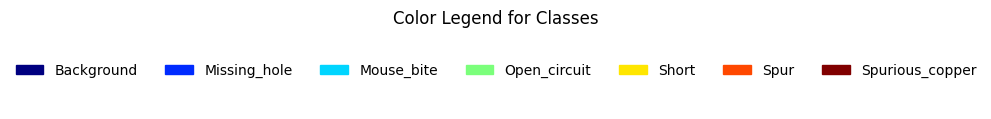

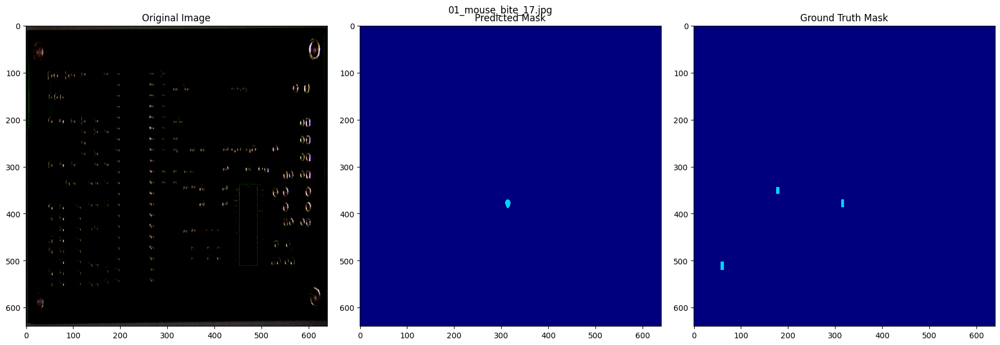


Image: 04_mouse_bite_10.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


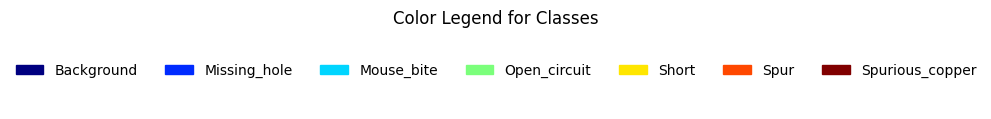

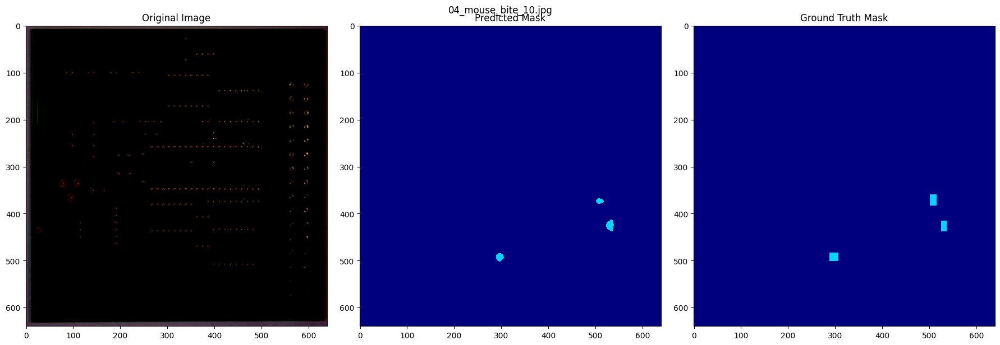

 11%|█         | 3/27 [00:10<01:23,  3.49s/it]


Image: 01_mouse_bite_15.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 3 6]


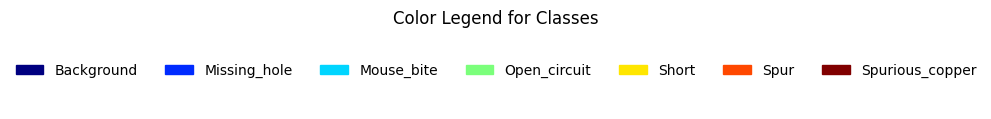

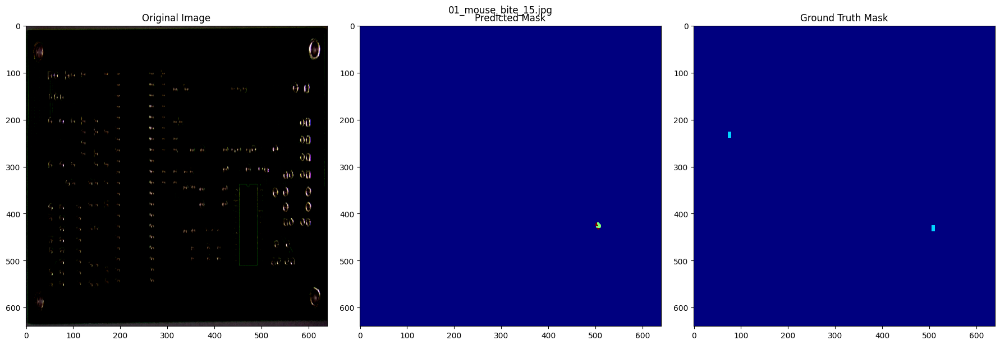


Image: 06_mouse_bite_07.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2 3]


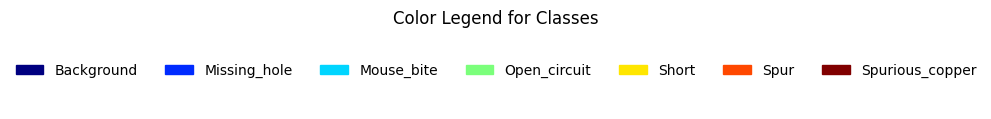

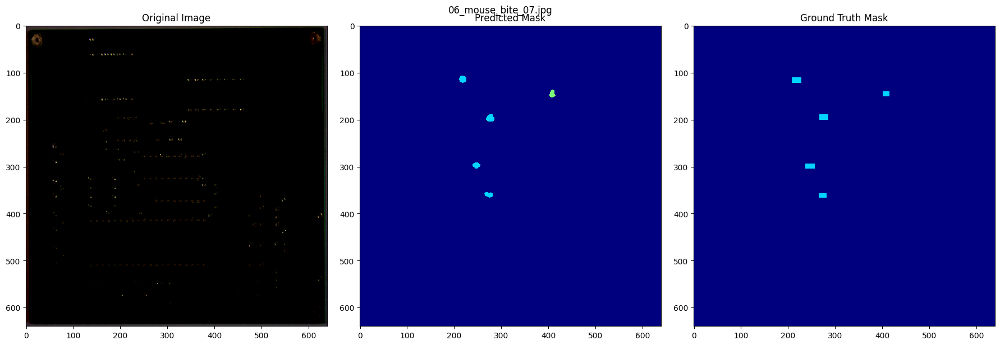


Image: 04_mouse_bite_13.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


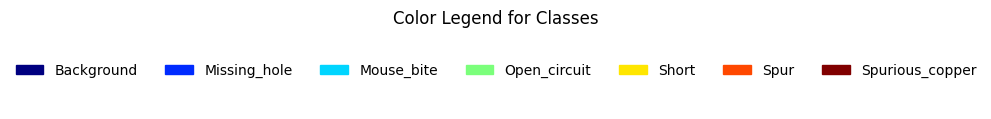

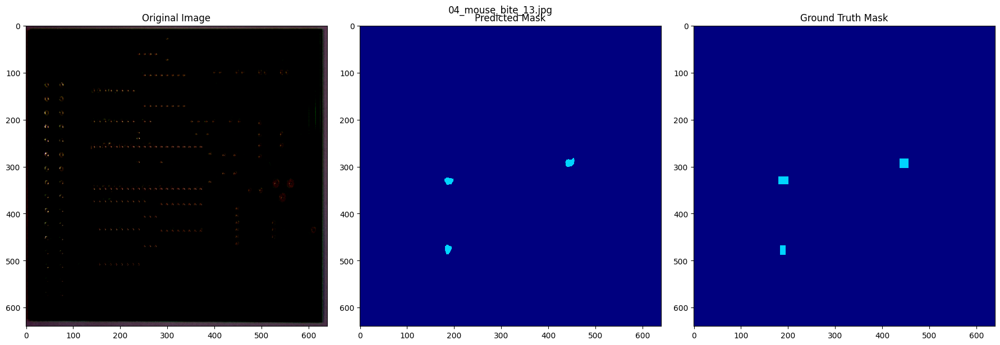


Image: 01_mouse_bite_01.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2 3]


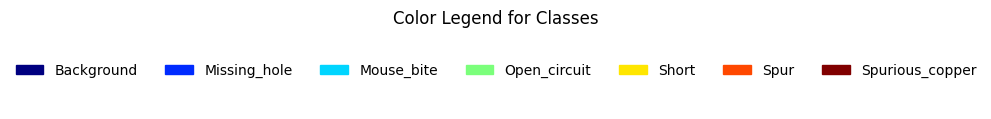

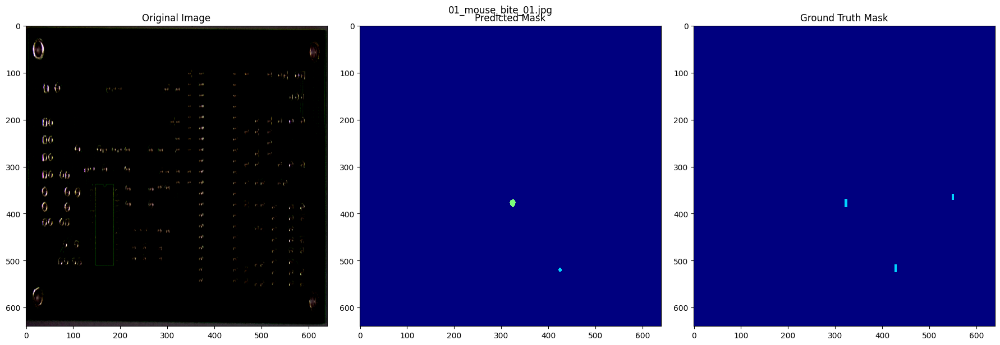

 15%|█▍        | 4/27 [00:13<01:19,  3.44s/it]


Image: 04_mouse_bite_09.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


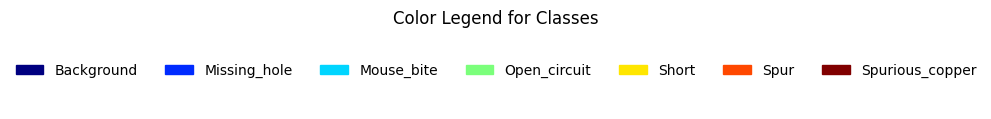

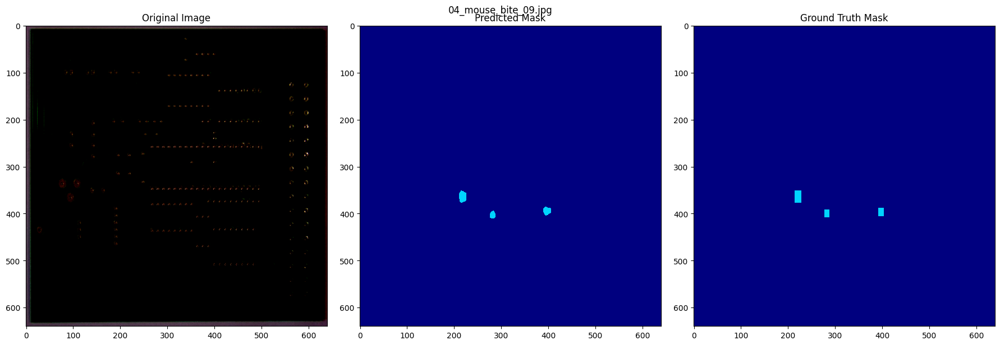


Image: 04_mouse_bite_19.jpg
Ground Truth Mask - Unique values: [0 2]
Predicted Mask - Unique values   : [0 2]


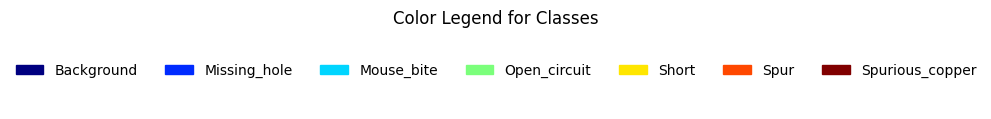

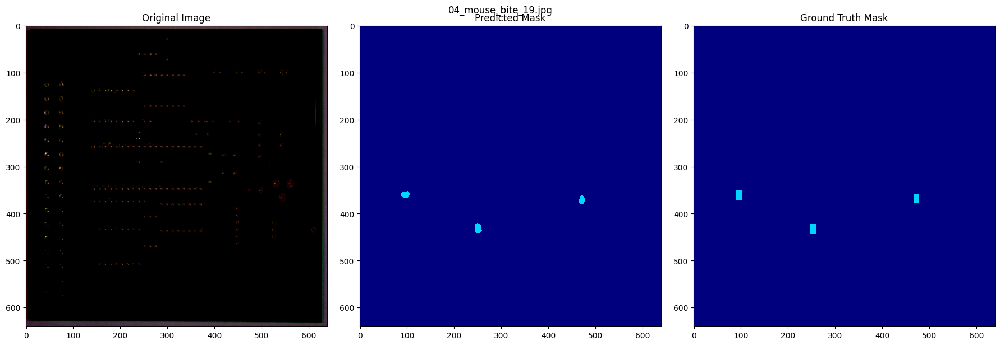


Image: 08_spur_01.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 3 5]


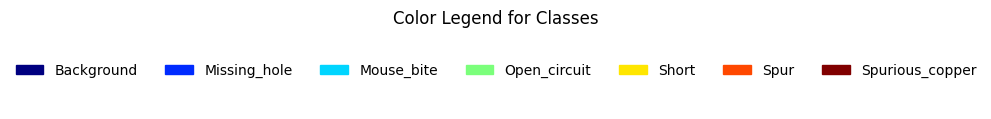

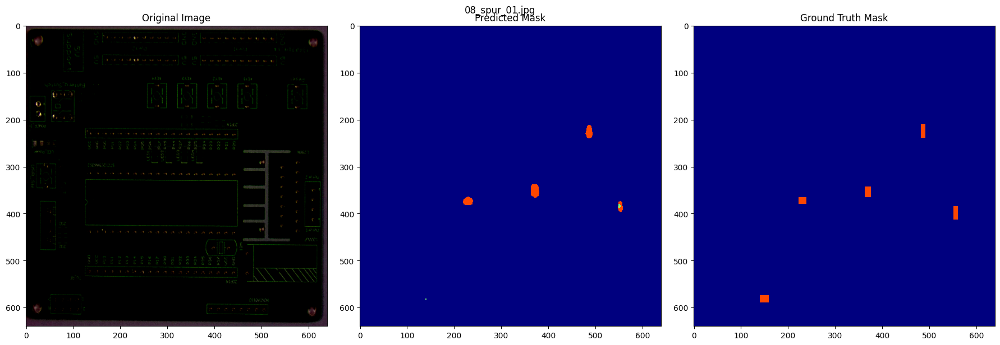


Image: 04_spur_04.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


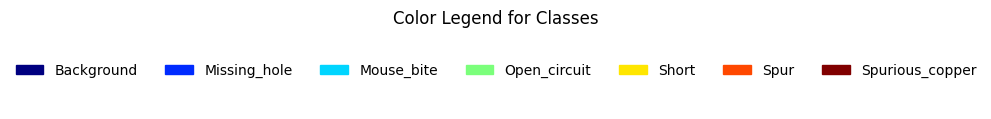

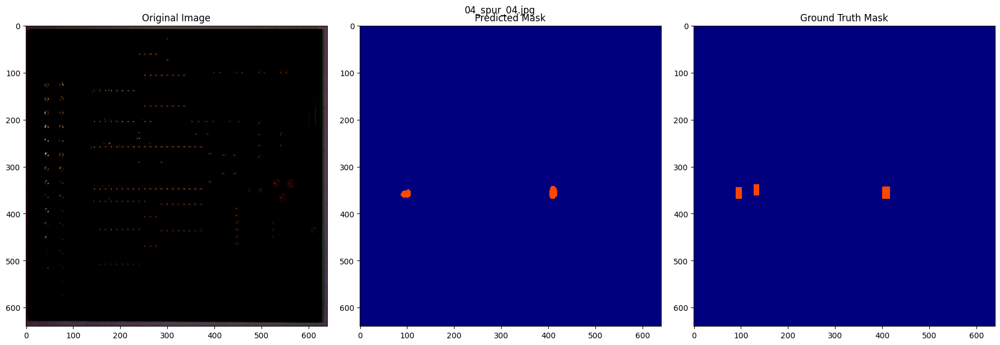

 19%|█▊        | 5/27 [00:17<01:16,  3.46s/it]


Image: 04_spur_05.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


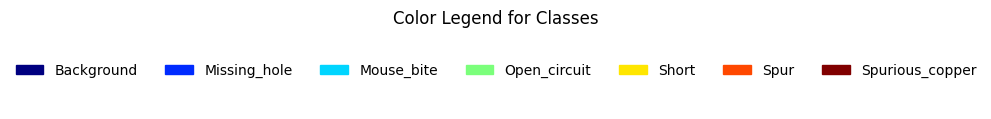

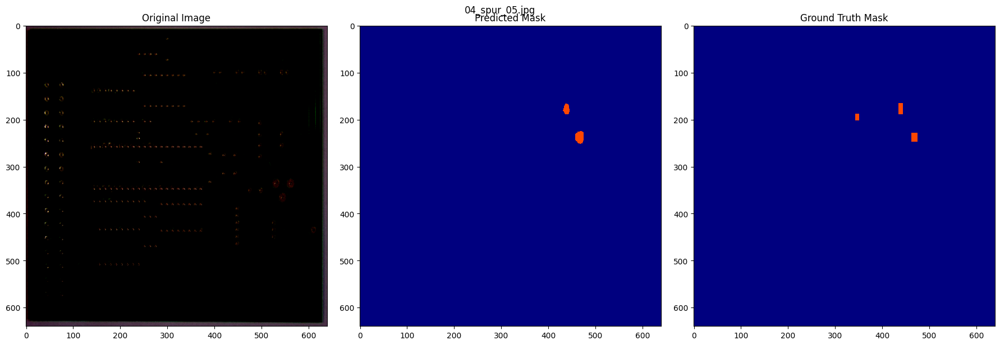


Image: 04_spur_13.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


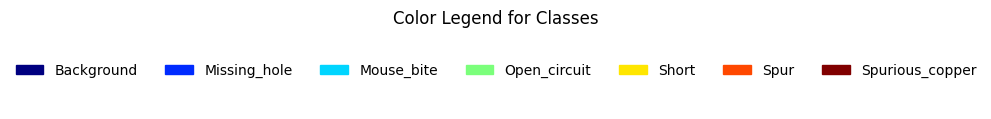

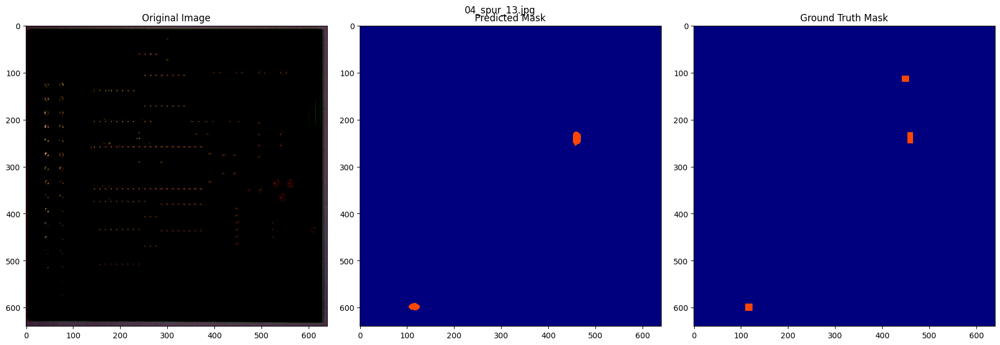


Image: 01_spur_03.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


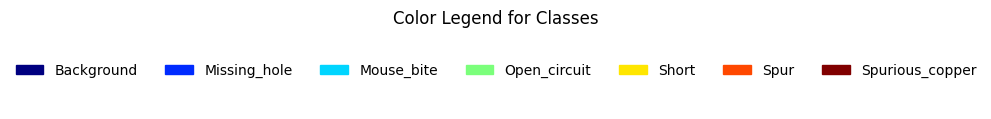

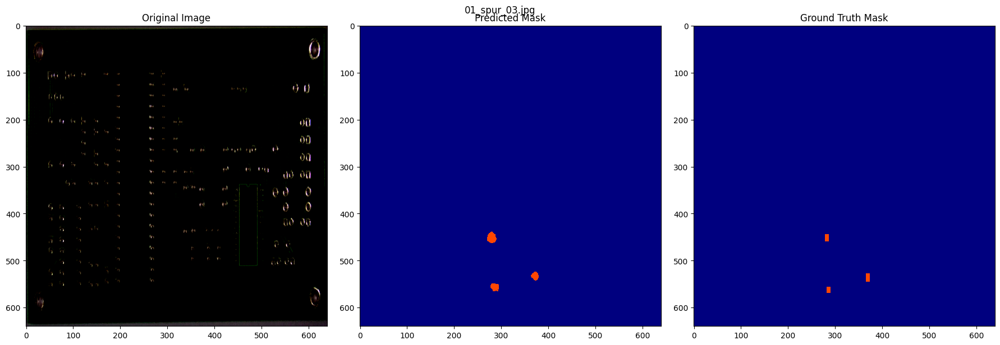


Image: 08_spur_08.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


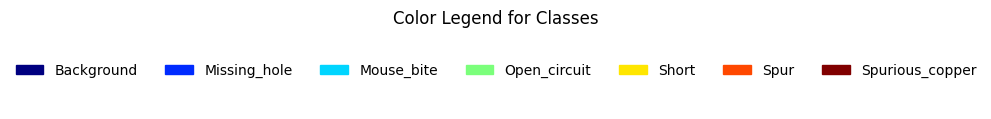

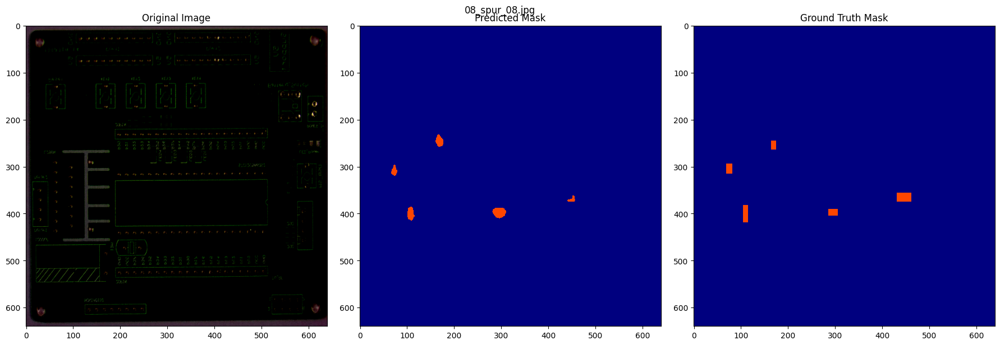

 22%|██▏       | 6/27 [00:20<01:14,  3.54s/it]


Image: 10_spur_04.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


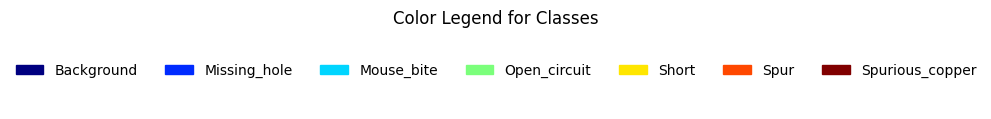

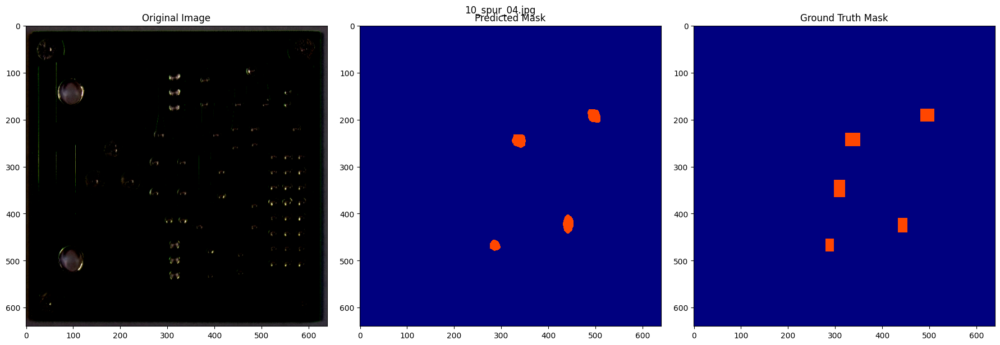


Image: 04_spur_07.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 2 5]


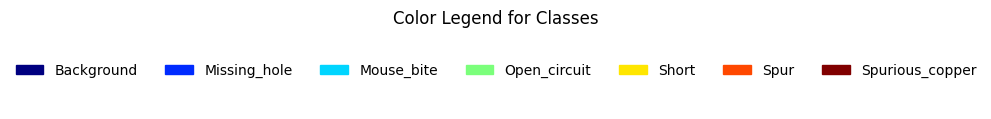

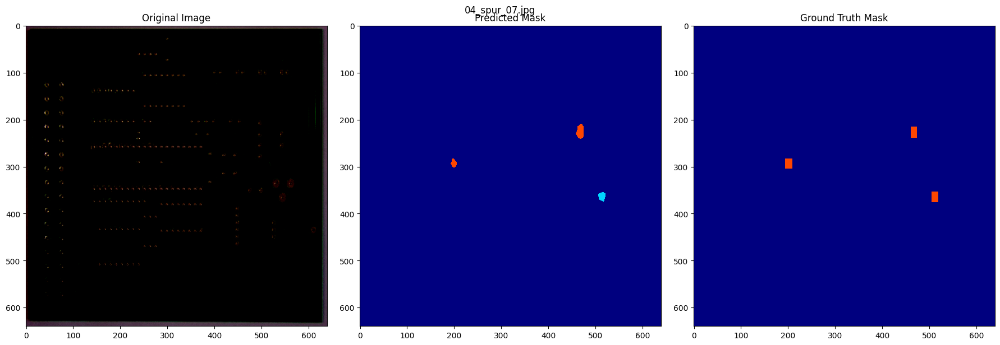


Image: 10_spur_02.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


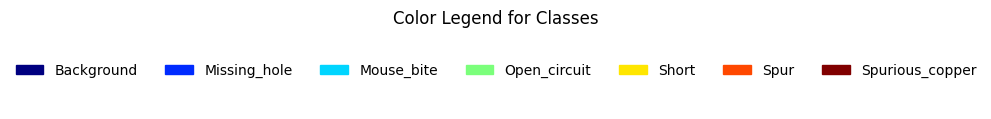

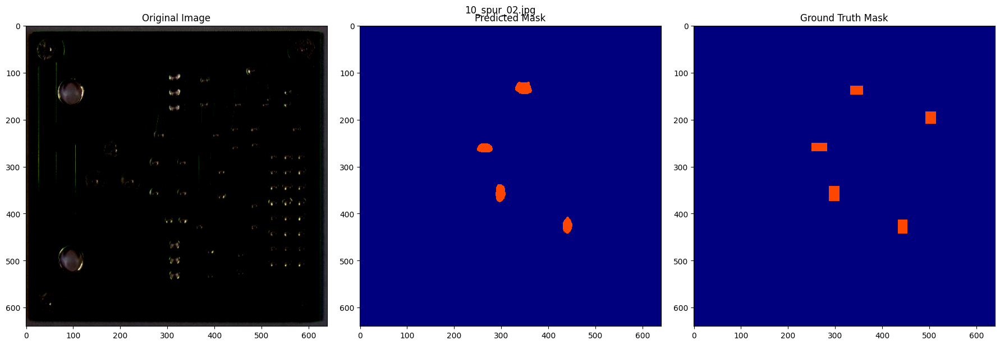


Image: 11_spur_06.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 2 5]


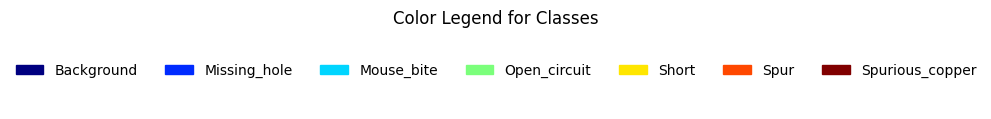

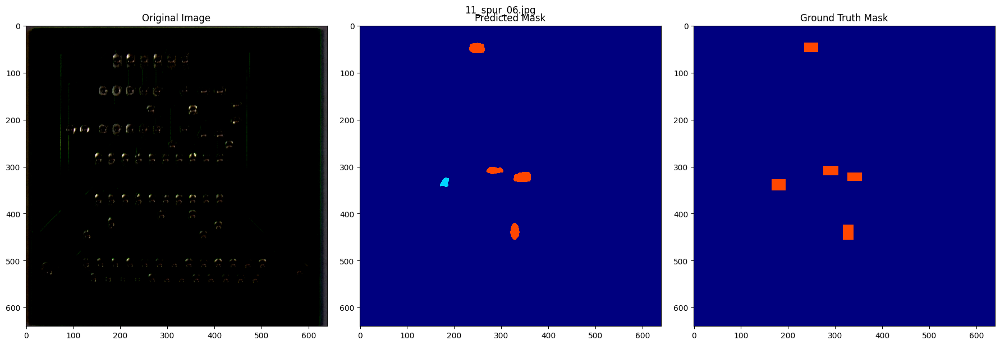

 26%|██▌       | 7/27 [00:24<01:09,  3.49s/it]


Image: 06_spur_09.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


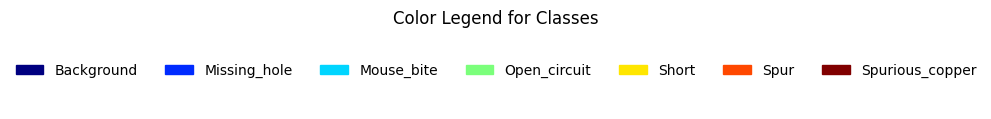

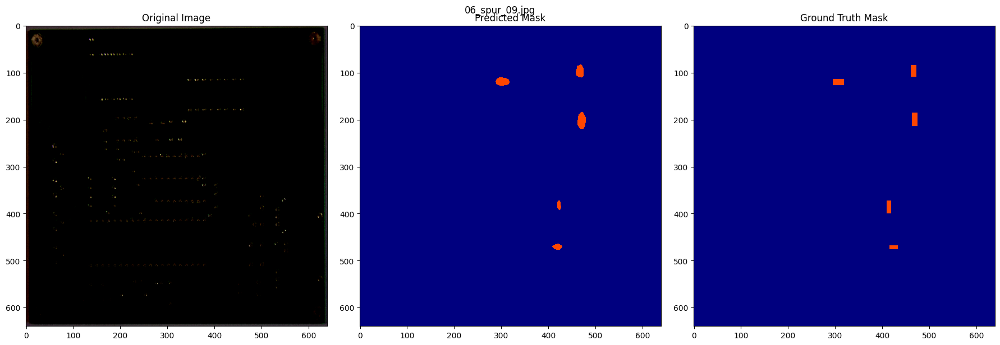


Image: 08_spur_09.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 3 5]


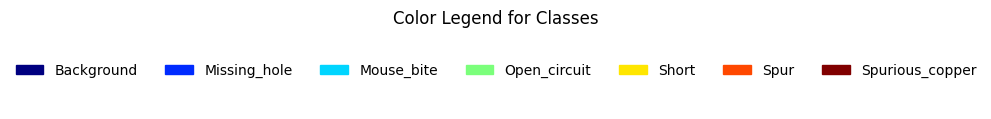

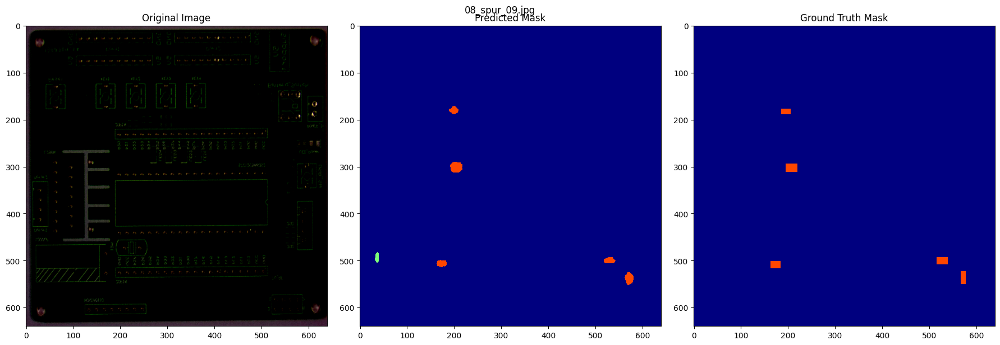


Image: 09_spur_04.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


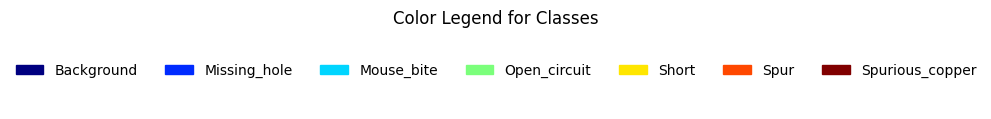

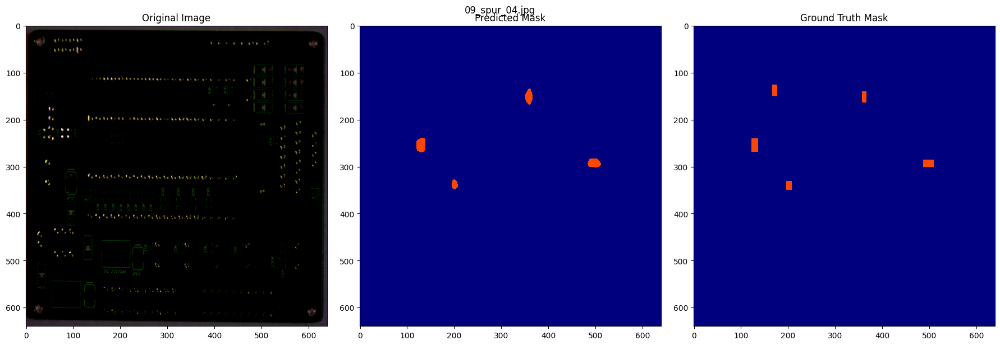


Image: 07_spur_08.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 2 5]


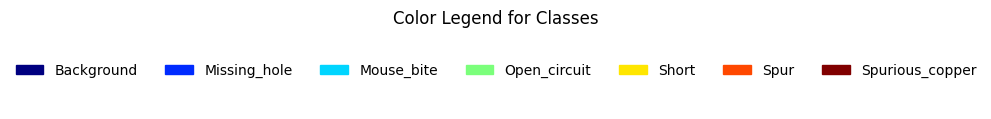

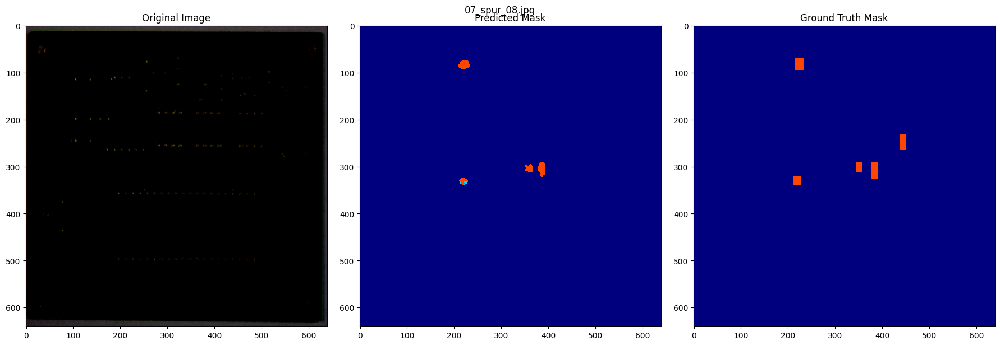

 30%|██▉       | 8/27 [00:27<01:05,  3.45s/it]


Image: 01_spur_13.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


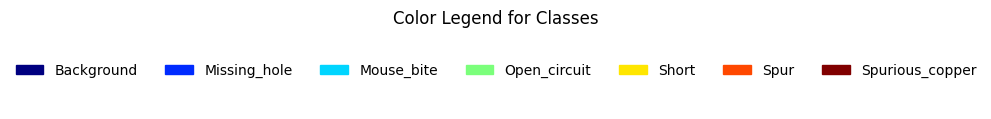

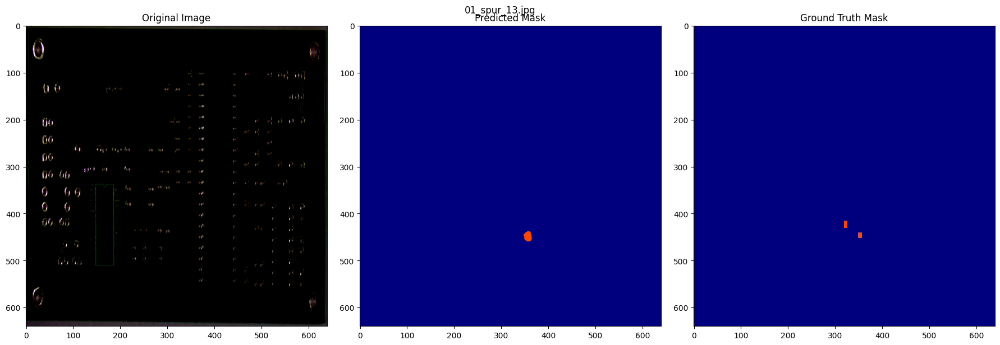


Image: 06_spur_04.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 2 5]


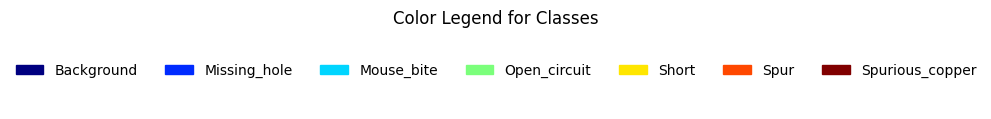

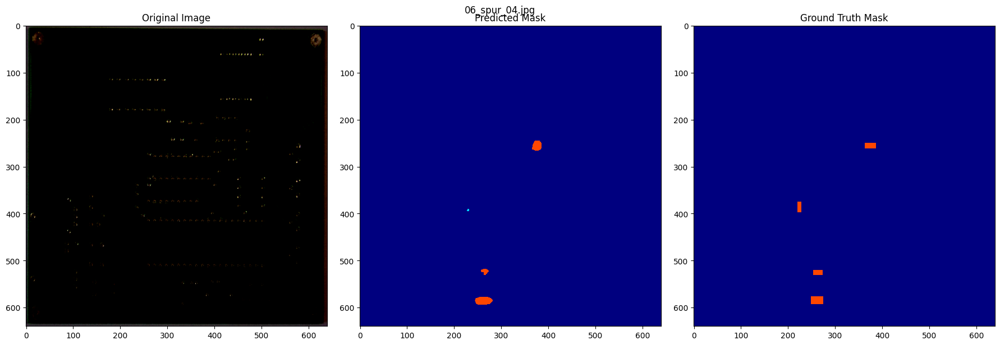


Image: 01_spur_14.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


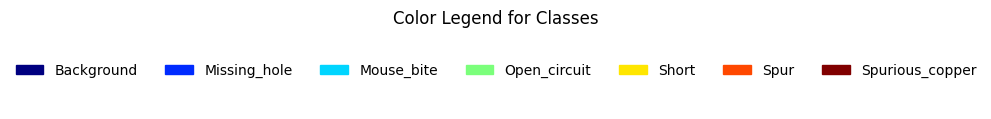

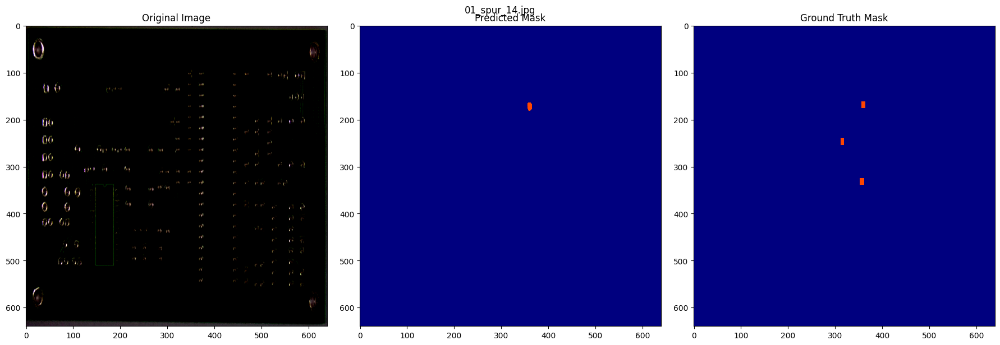


Image: 06_spur_10.jpg
Ground Truth Mask - Unique values: [0 5]
Predicted Mask - Unique values   : [0 5]


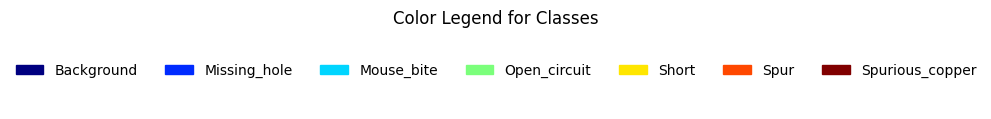

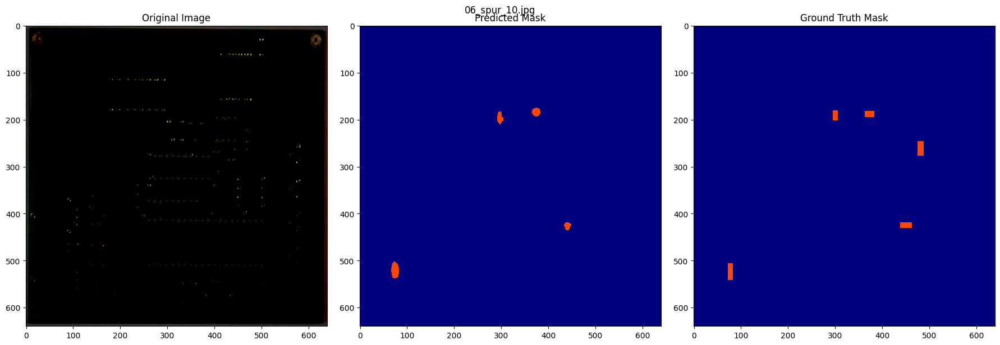

 33%|███▎      | 9/27 [00:31<01:02,  3.47s/it]


Image: 10_open_circuit_04.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


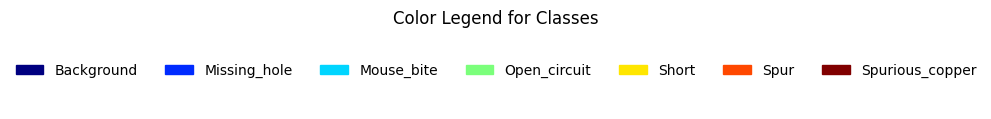

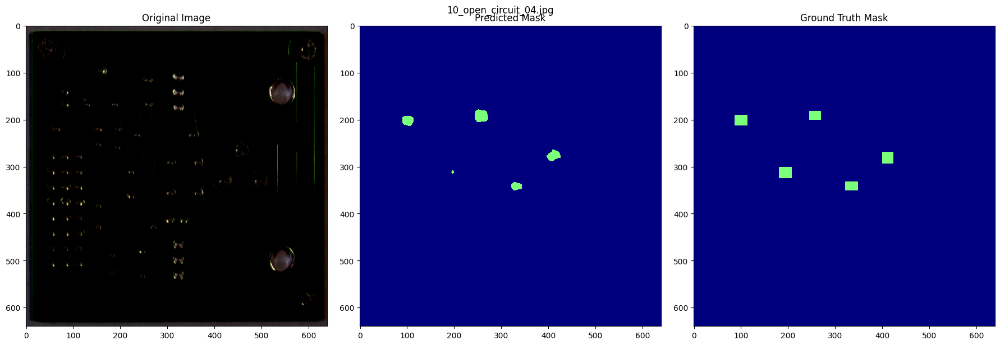


Image: 11_open_circuit_06.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


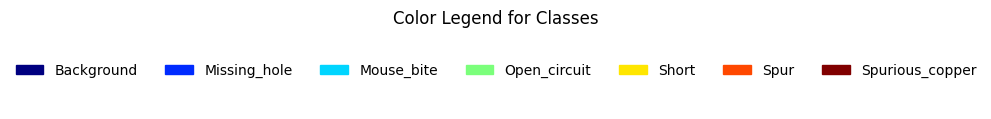

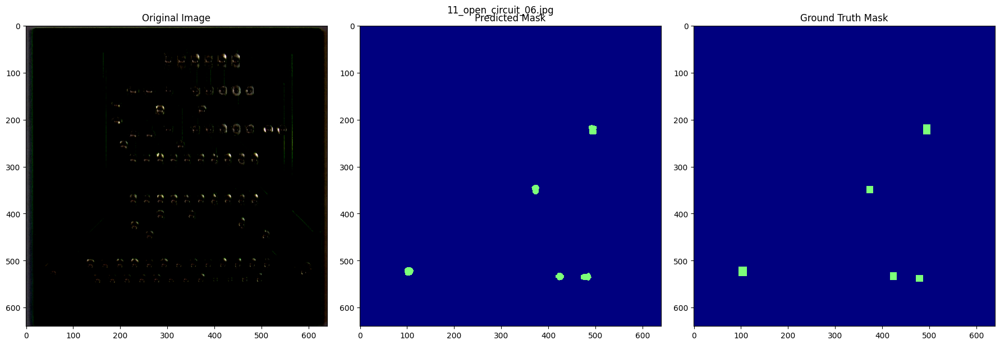


Image: 07_open_circuit_06.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


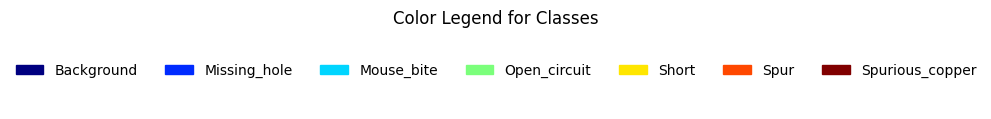

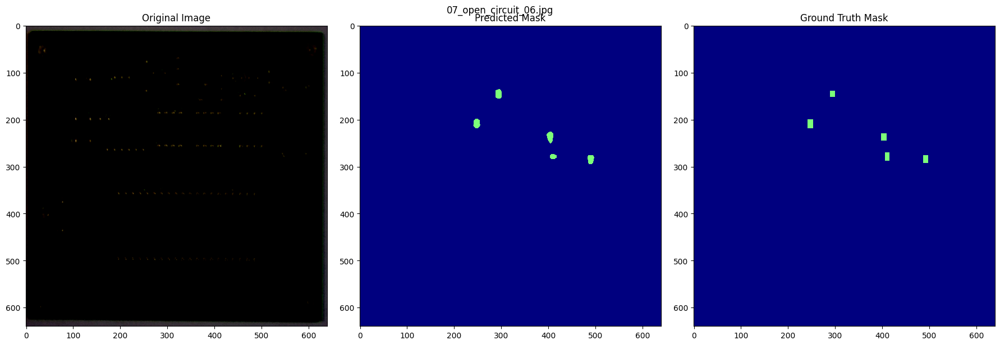


Image: 07_open_circuit_04.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


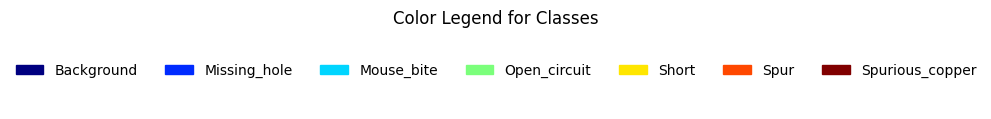

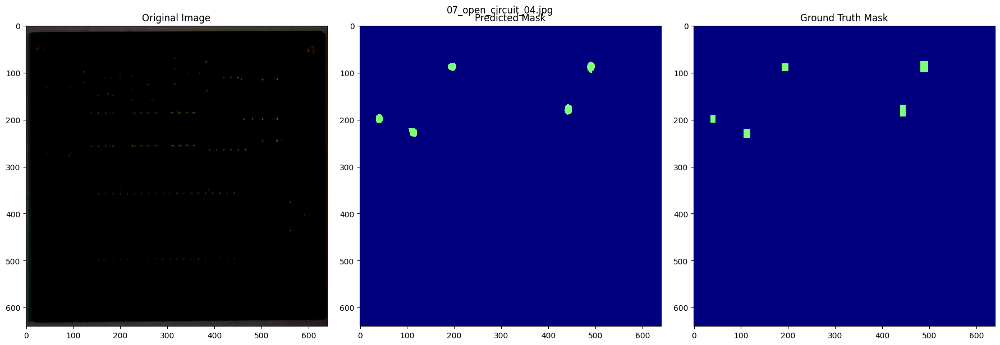

 37%|███▋      | 10/27 [00:34<00:58,  3.42s/it]


Image: 04_open_circuit_11.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


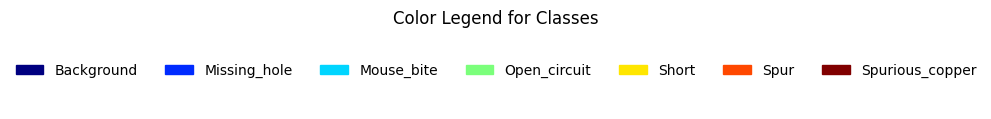

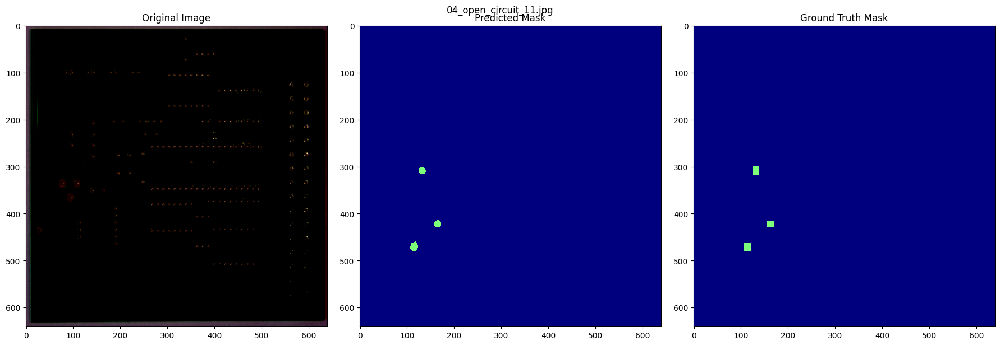


Image: 06_open_circuit_01.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 2 3]


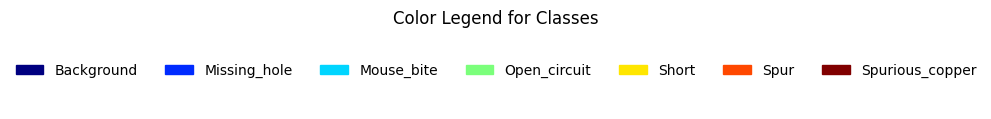

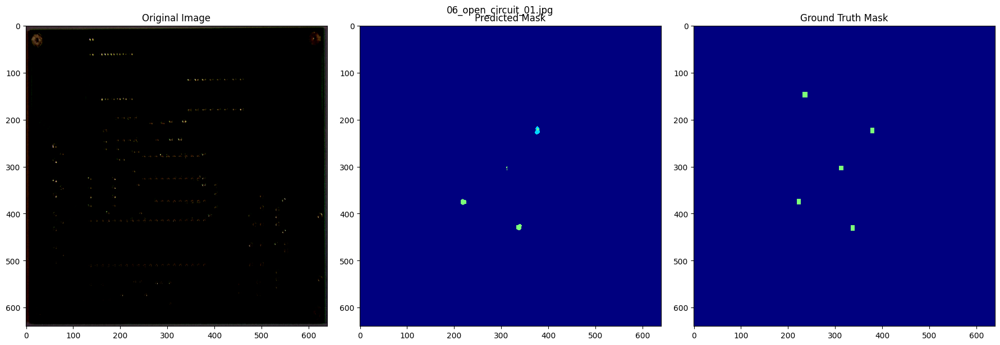


Image: 01_open_circuit_02.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3 5]


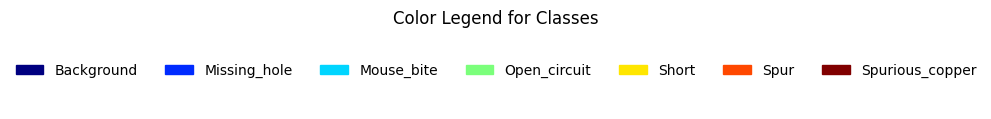

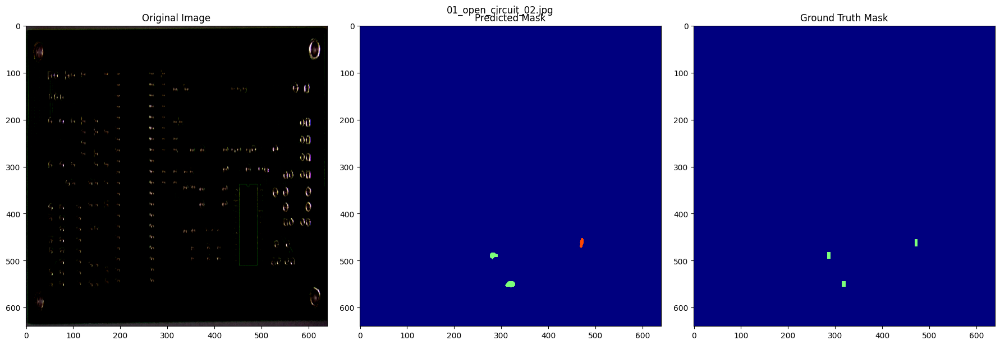


Image: 12_open_circuit_09.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


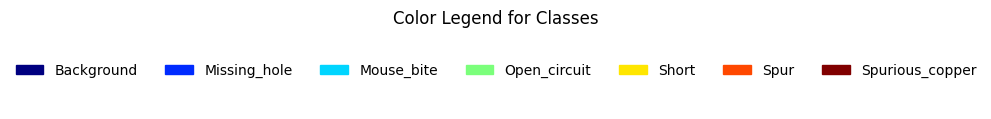

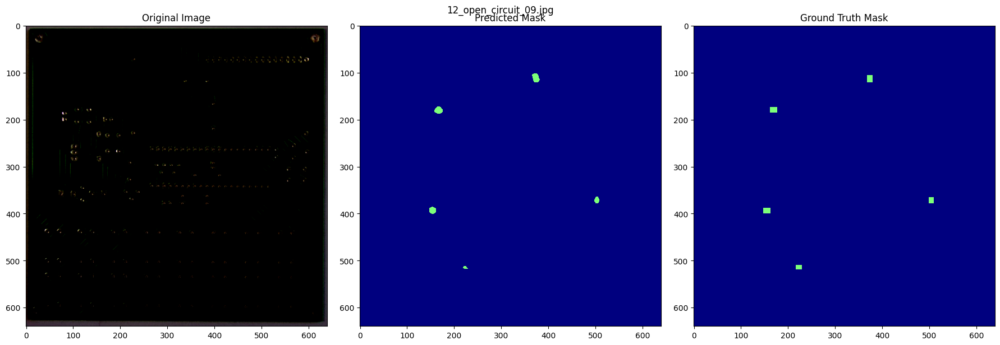

 41%|████      | 11/27 [00:37<00:54,  3.41s/it]


Image: 11_open_circuit_10.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 2 3]


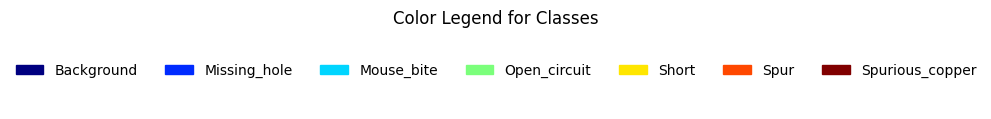

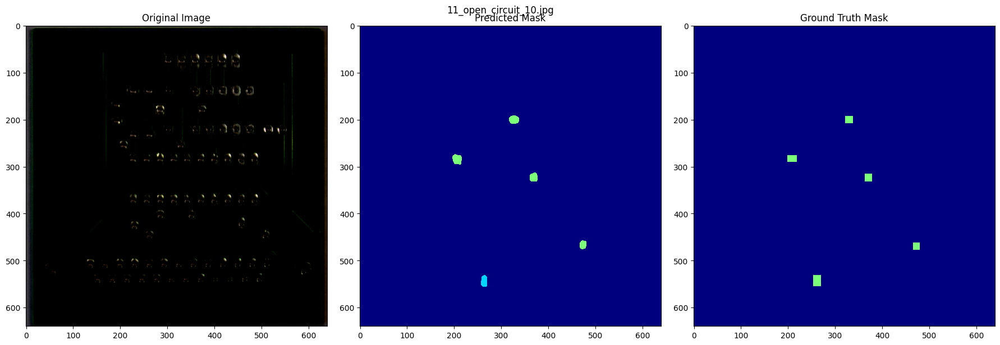


Image: 06_open_circuit_06.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 2 3]


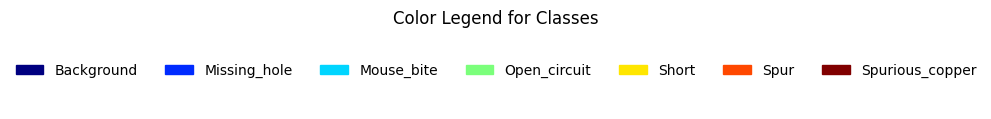

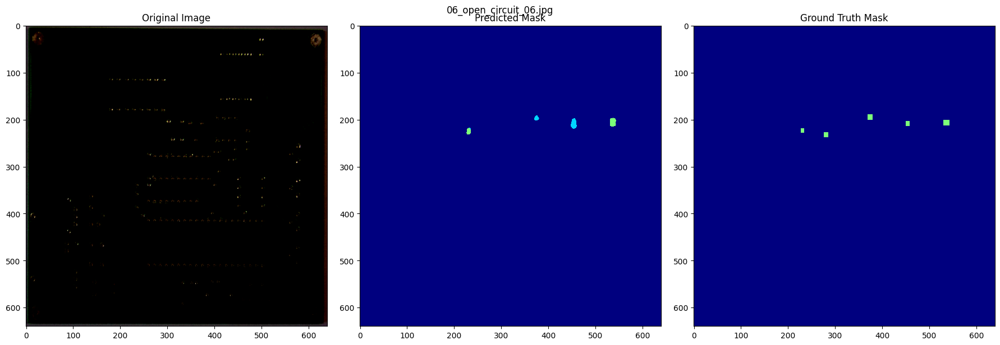


Image: 08_open_circuit_08.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 2 3]


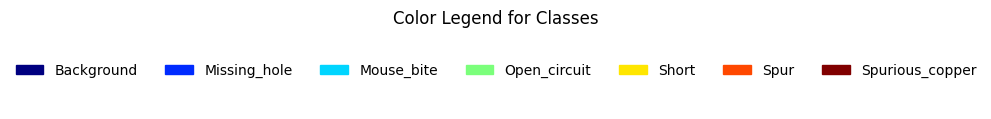

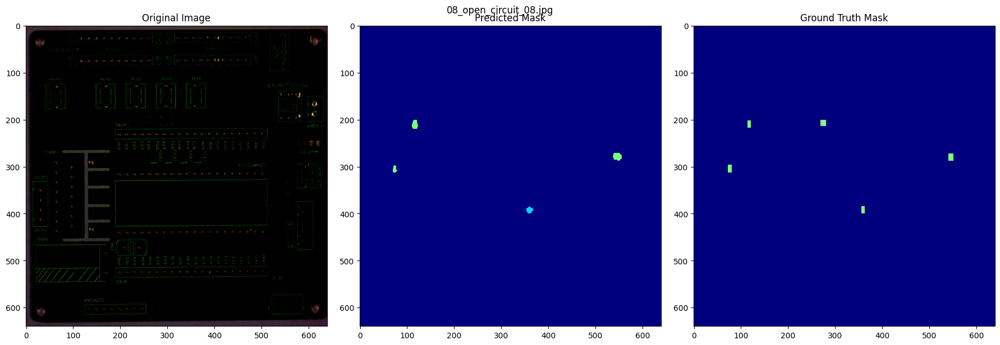


Image: 01_open_circuit_17.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


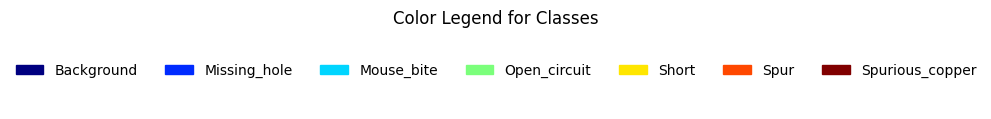

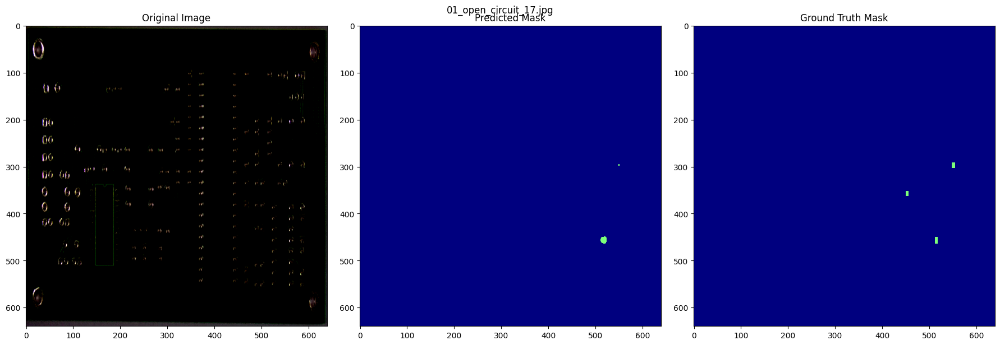

 44%|████▍     | 12/27 [00:41<00:51,  3.46s/it]


Image: 09_open_circuit_10.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


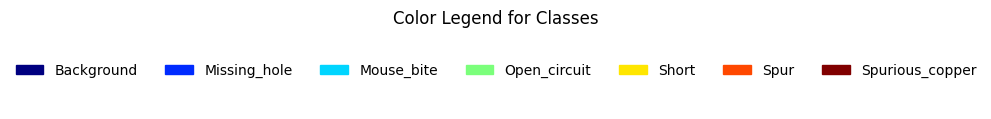

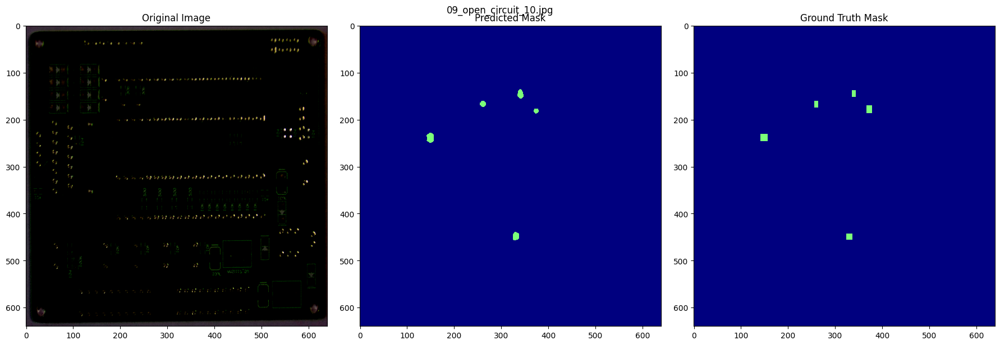


Image: 04_open_circuit_17.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


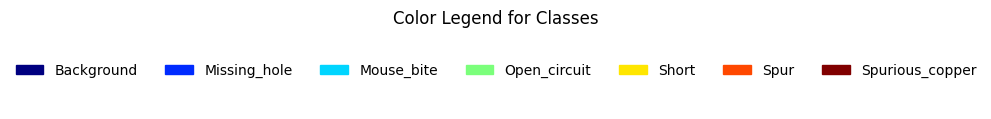

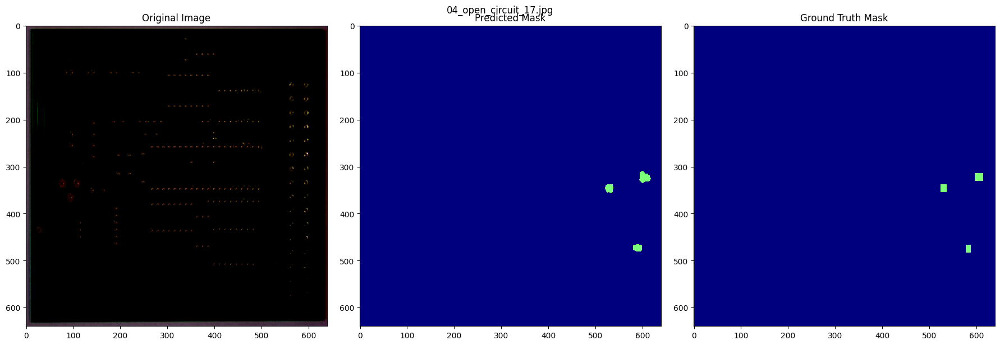


Image: 05_open_circuit_05.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


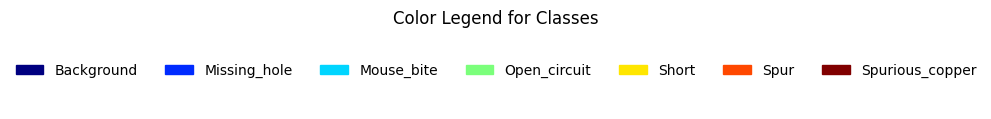

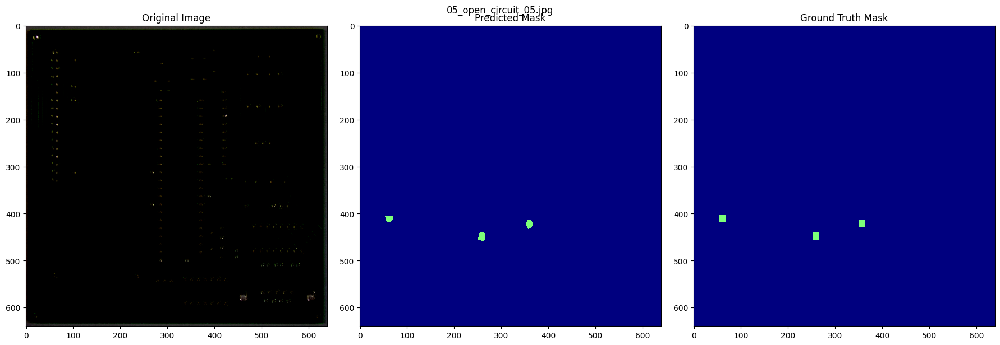


Image: 01_open_circuit_08.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


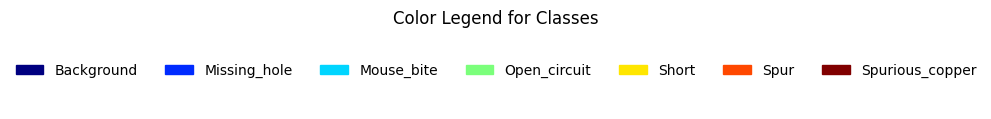

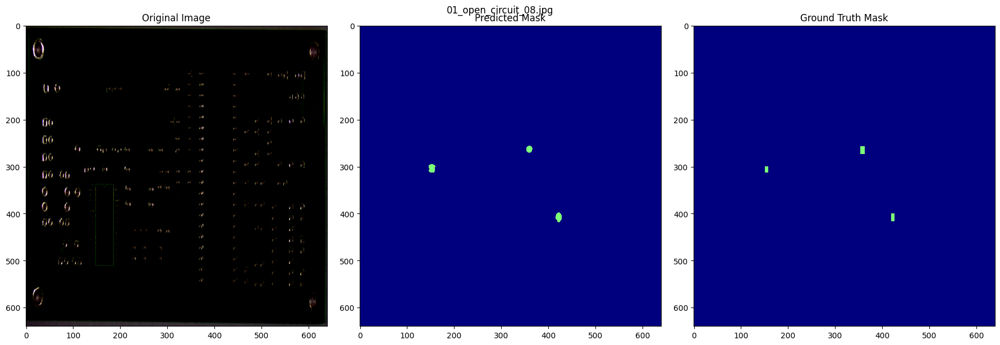

 48%|████▊     | 13/27 [00:44<00:48,  3.44s/it]


Image: 10_open_circuit_02.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 2 3 6]


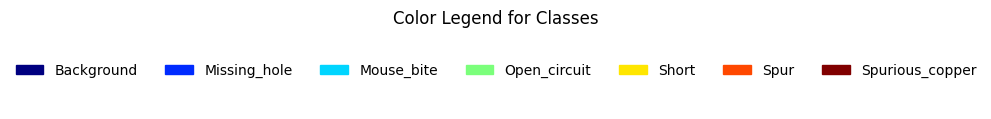

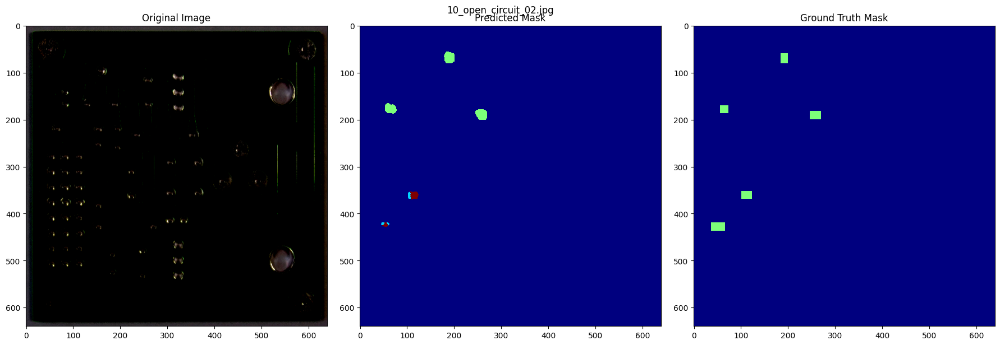


Image: 04_open_circuit_08.jpg
Ground Truth Mask - Unique values: [0 3]
Predicted Mask - Unique values   : [0 3]


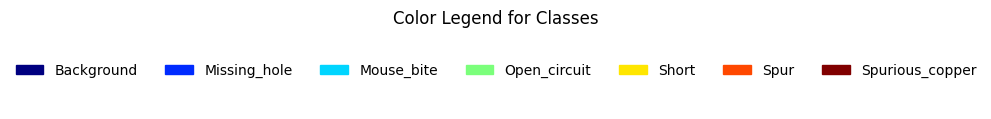

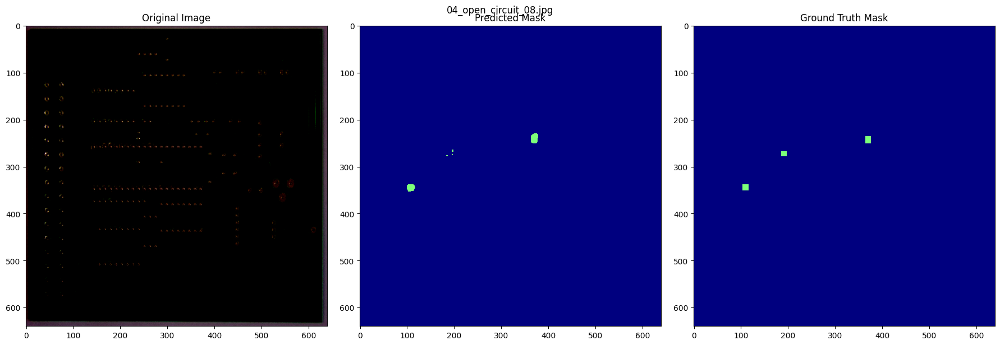


Image: 09_short_09.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


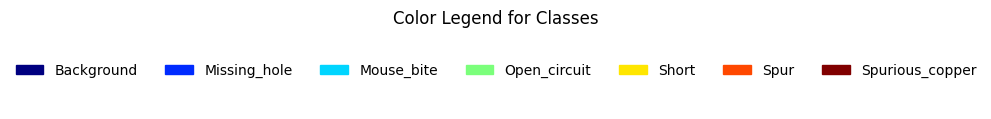

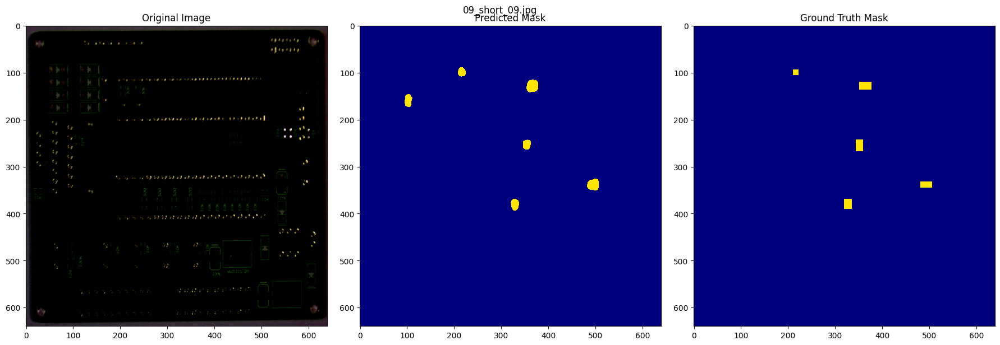


Image: 01_short_02.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


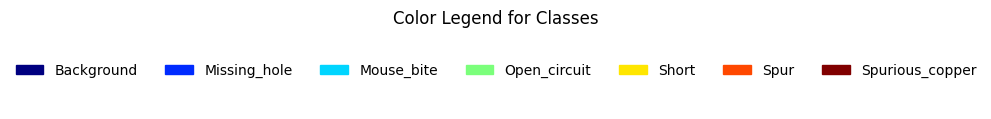

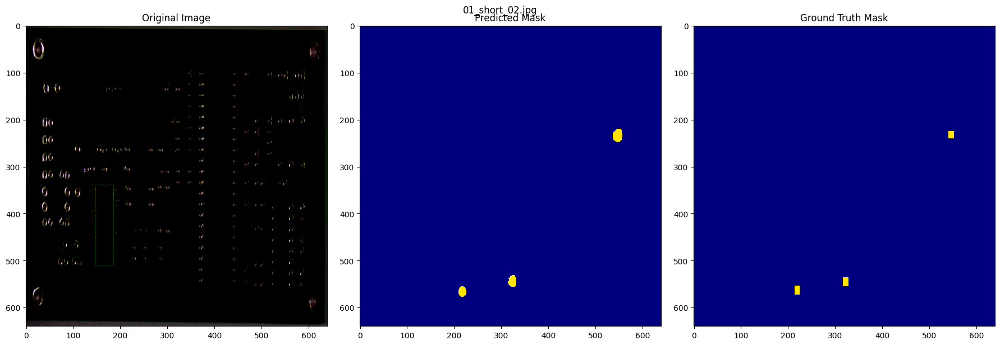

 52%|█████▏    | 14/27 [00:48<00:45,  3.48s/it]


Image: 08_short_02.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


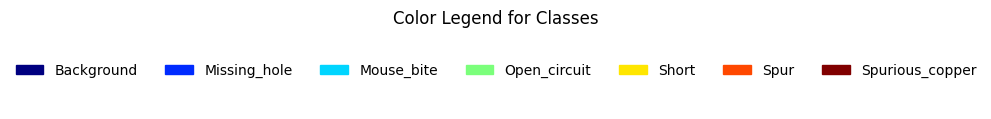

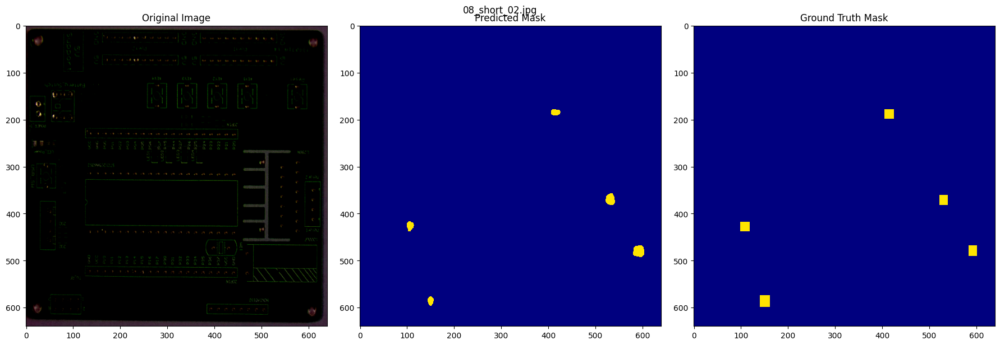


Image: 07_short_05.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


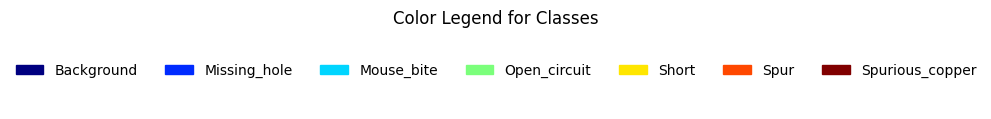

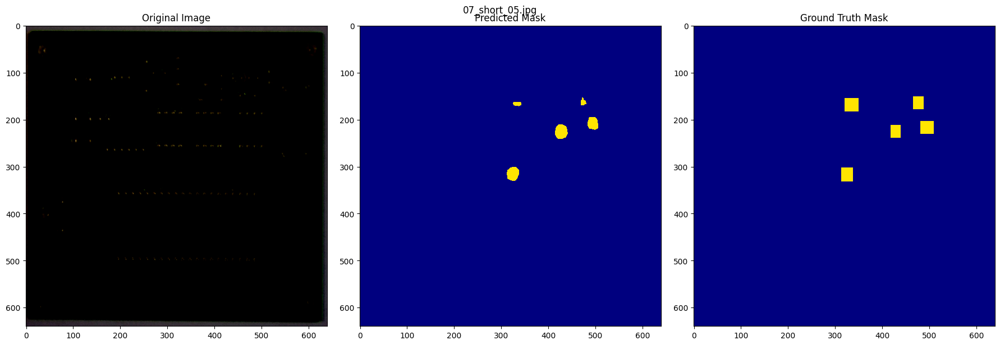


Image: 08_short_04.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 3 4]


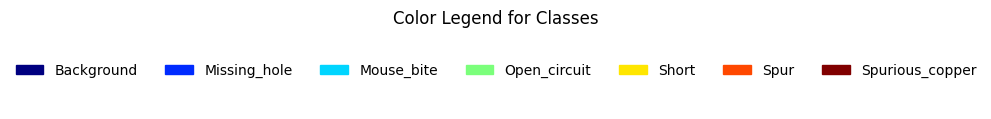

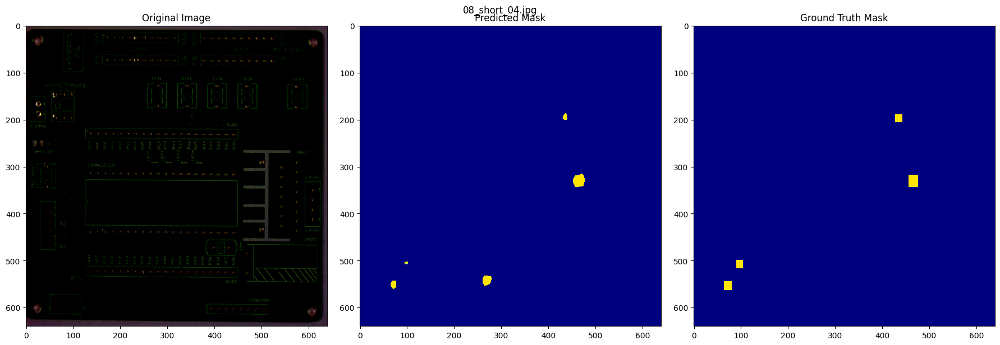


Image: 04_short_16.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


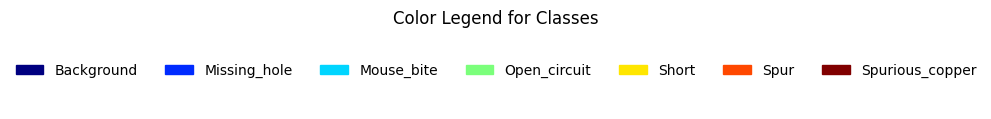

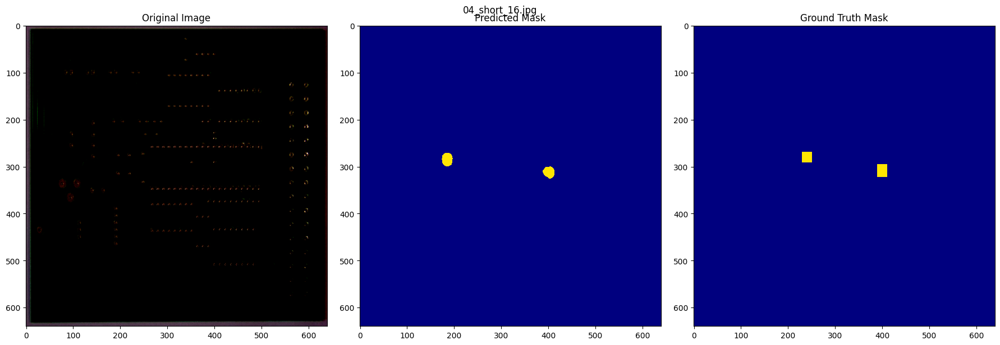

 56%|█████▌    | 15/27 [00:51<00:41,  3.44s/it]


Image: 06_short_02.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


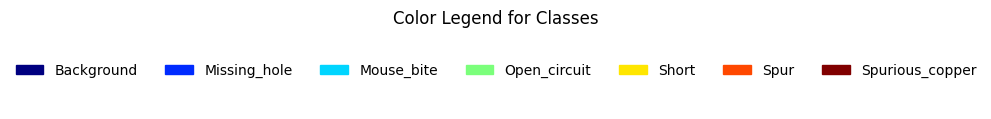

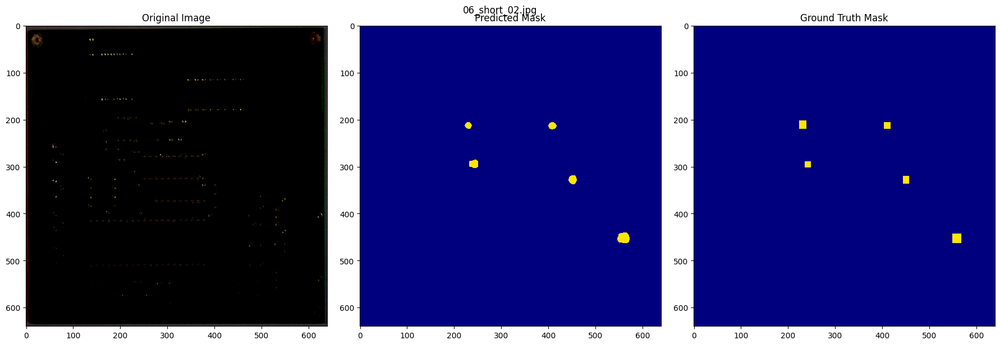


Image: 08_short_03.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


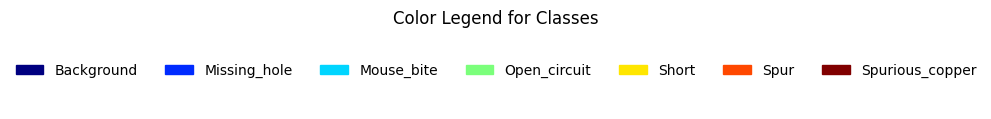

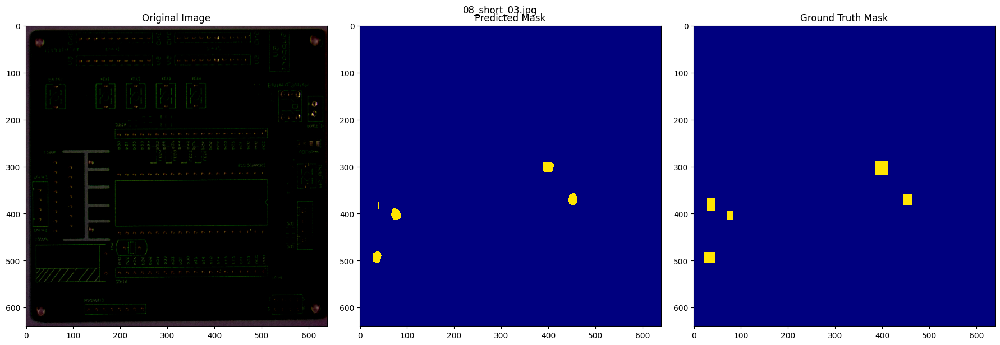


Image: 04_short_02.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


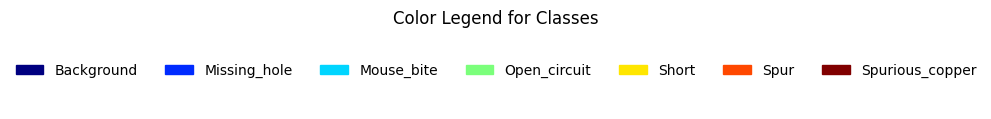

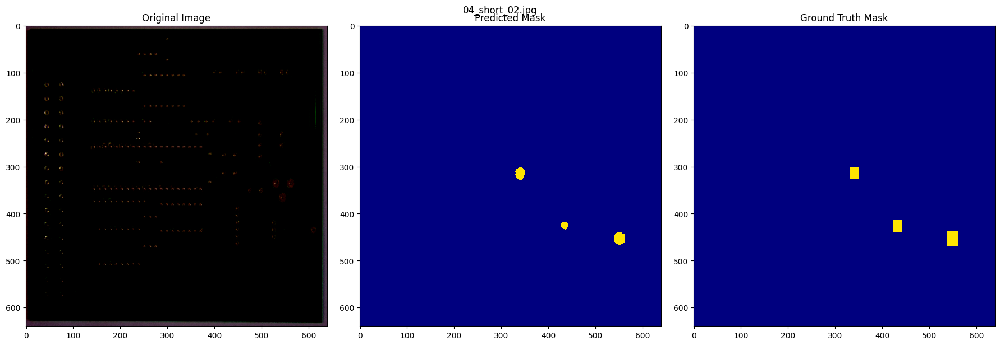


Image: 05_short_06.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


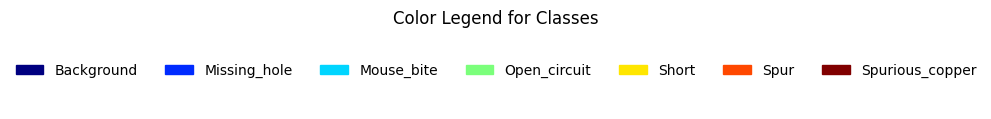

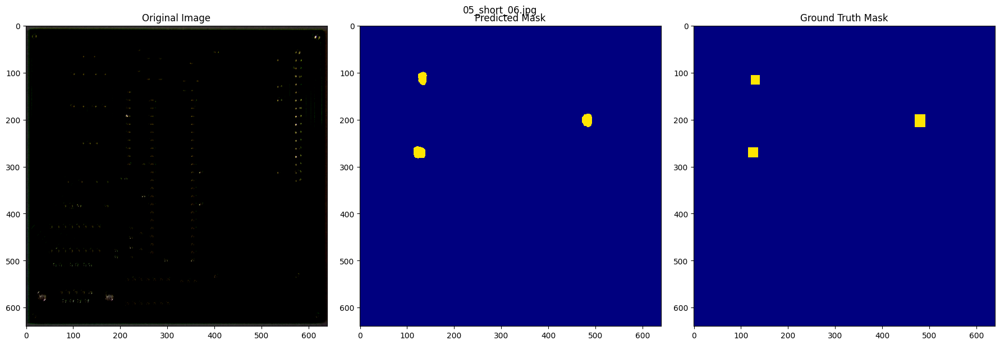

 59%|█████▉    | 16/27 [00:55<00:37,  3.42s/it]


Image: 07_short_01.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


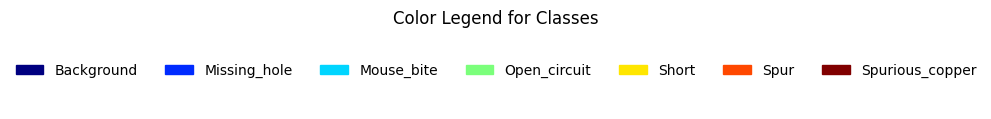

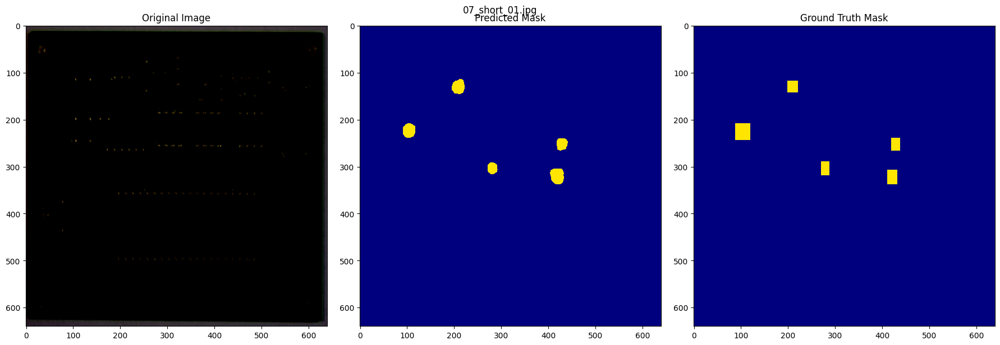


Image: 01_short_09.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


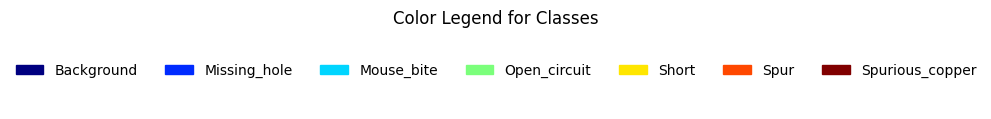

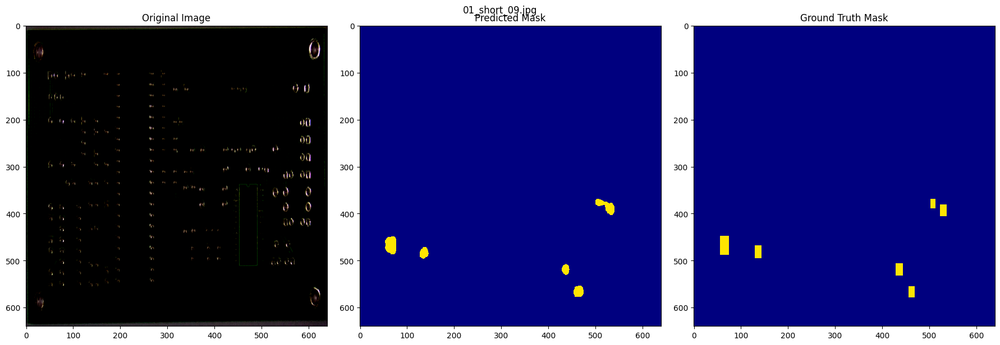


Image: 09_short_06.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


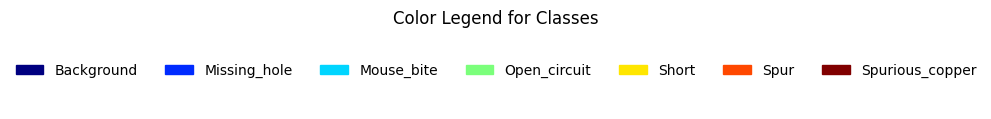

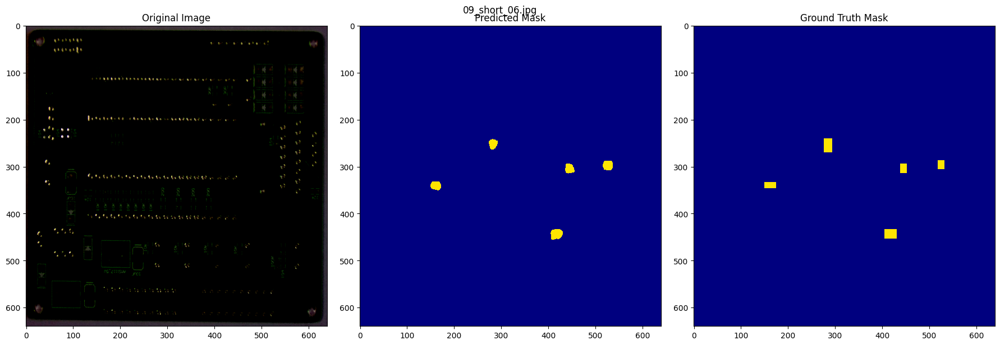


Image: 04_short_15.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


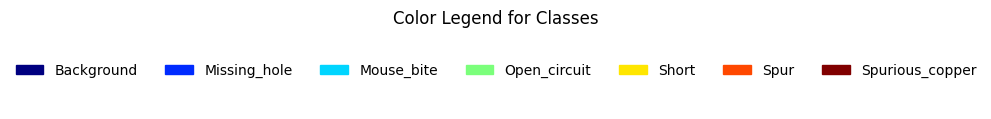

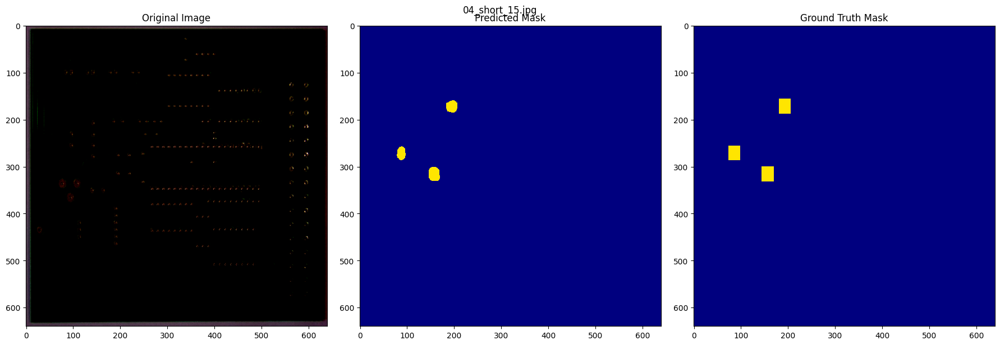

 63%|██████▎   | 17/27 [00:58<00:34,  3.49s/it]


Image: 04_short_11.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


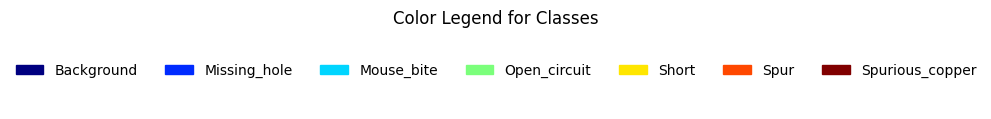

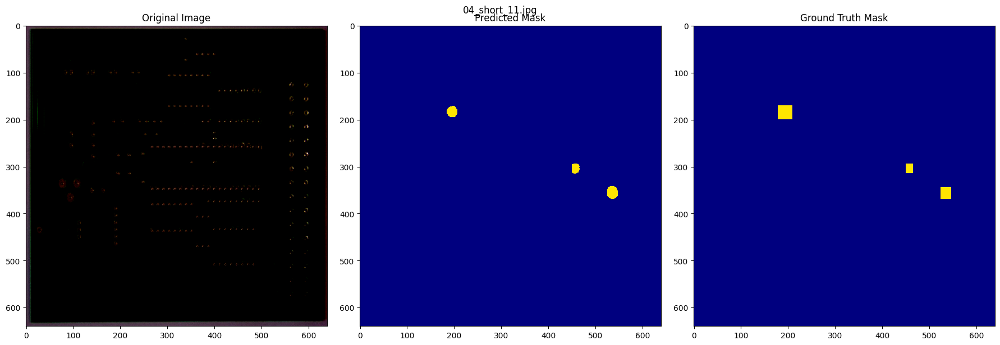


Image: 10_short_05.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4 5]


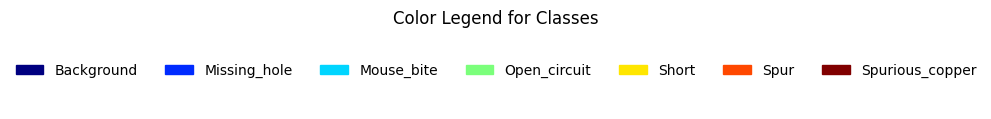

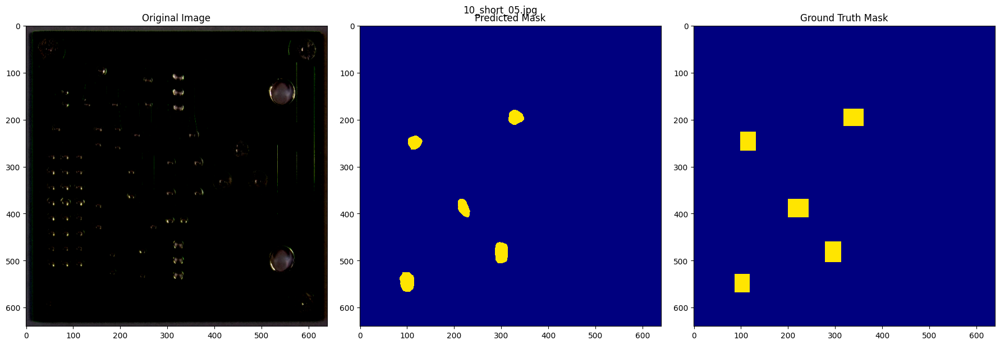


Image: 08_short_10.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


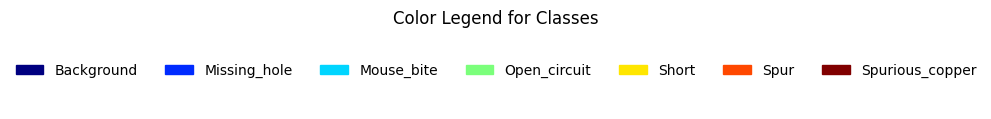

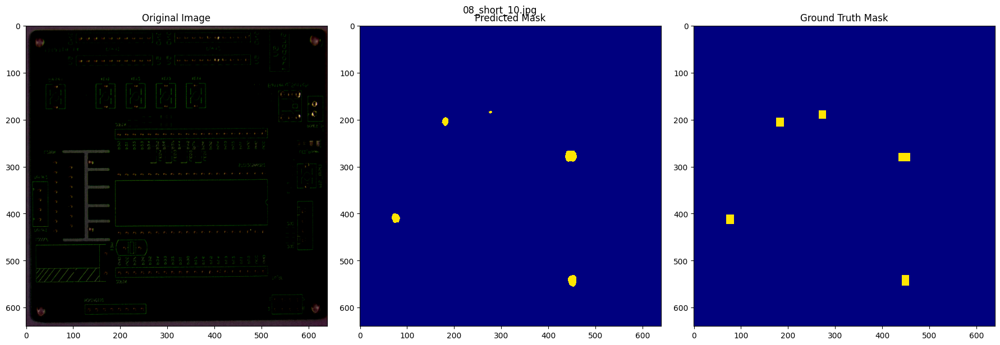


Image: 08_short_05.jpg
Ground Truth Mask - Unique values: [0 4]
Predicted Mask - Unique values   : [0 4]


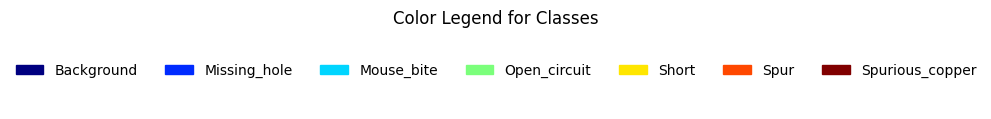

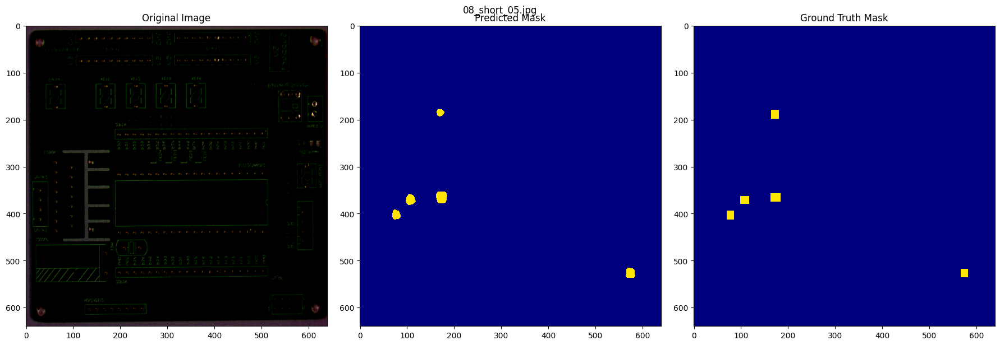

 67%|██████▋   | 18/27 [01:02<00:30,  3.44s/it]


Image: 01_missing_hole_17.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


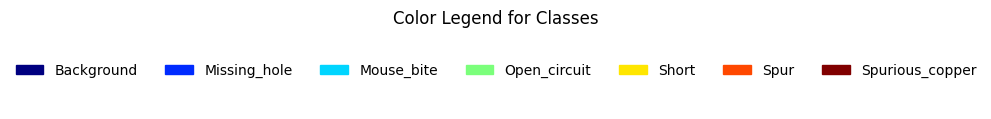

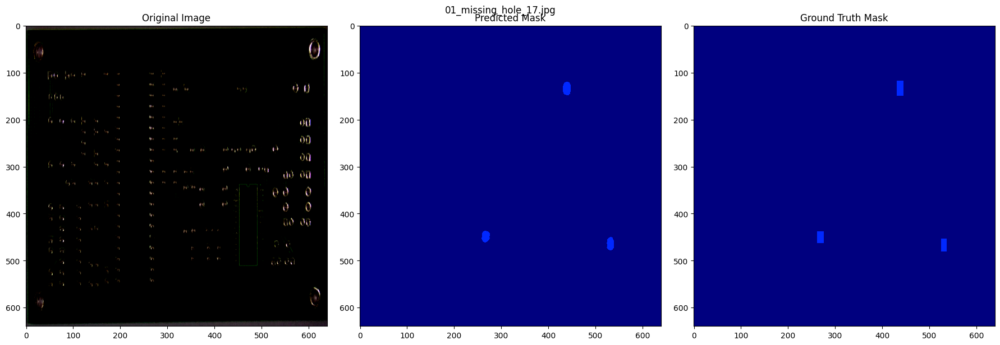


Image: 01_missing_hole_08.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


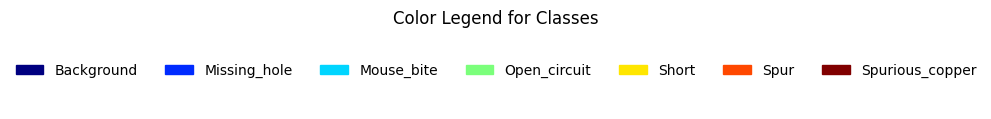

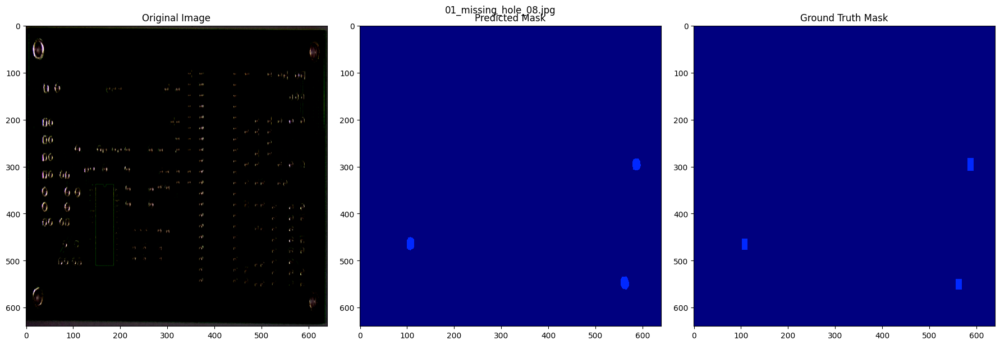


Image: 10_missing_hole_05.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


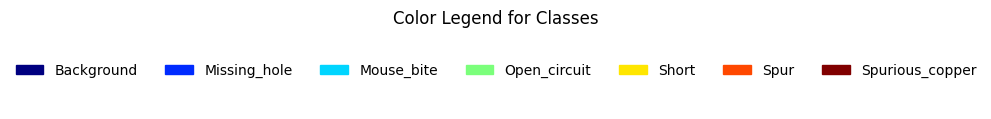

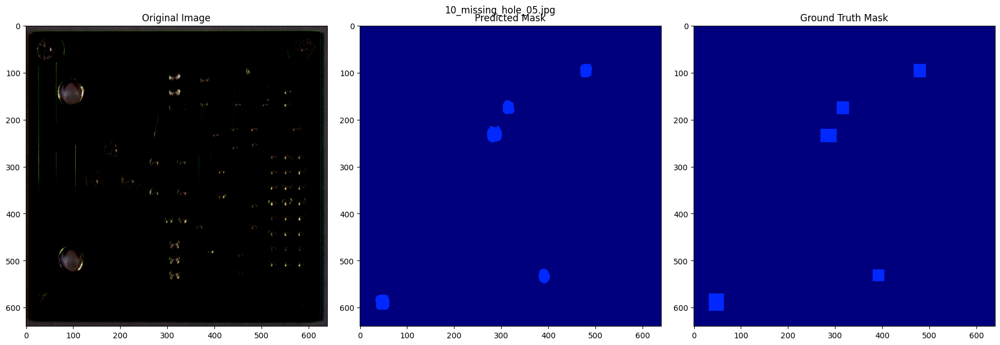


Image: 01_missing_hole_05.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


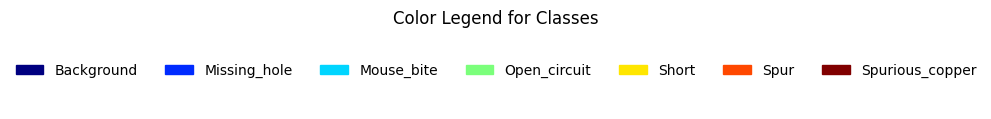

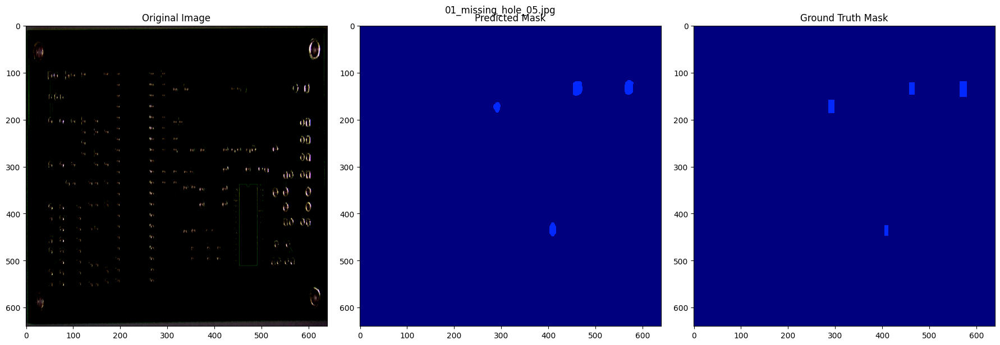

 70%|███████   | 19/27 [01:05<00:26,  3.37s/it]


Image: 06_missing_hole_10.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


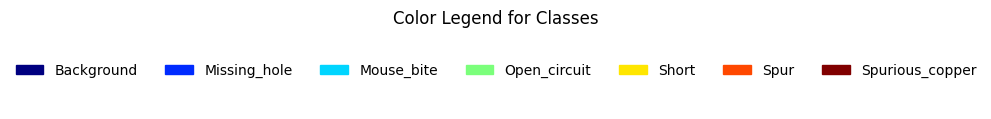

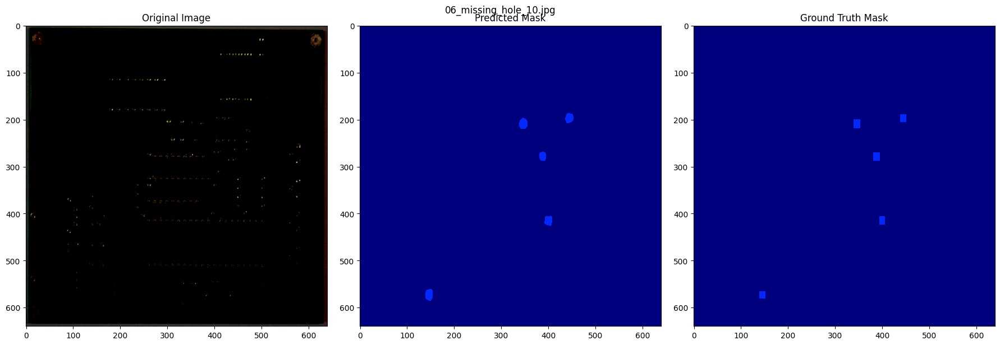


Image: 01_missing_hole_04.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


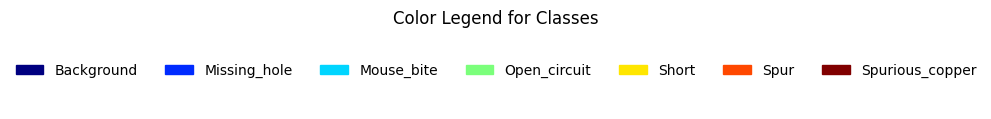

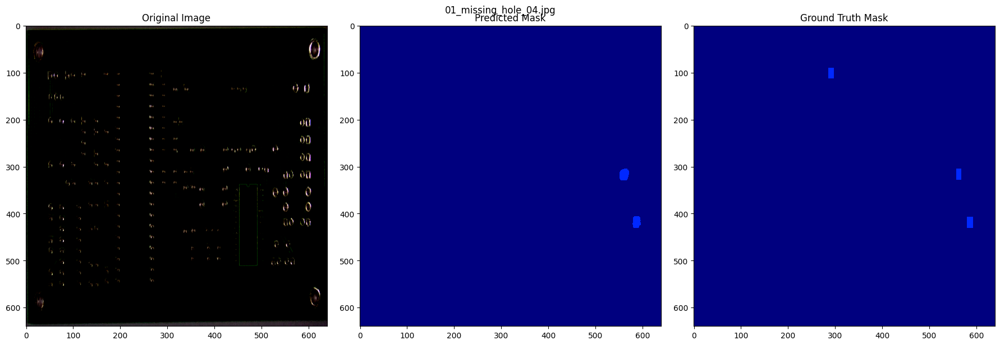


Image: 06_missing_hole_09.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


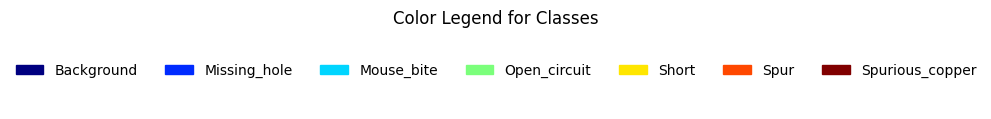

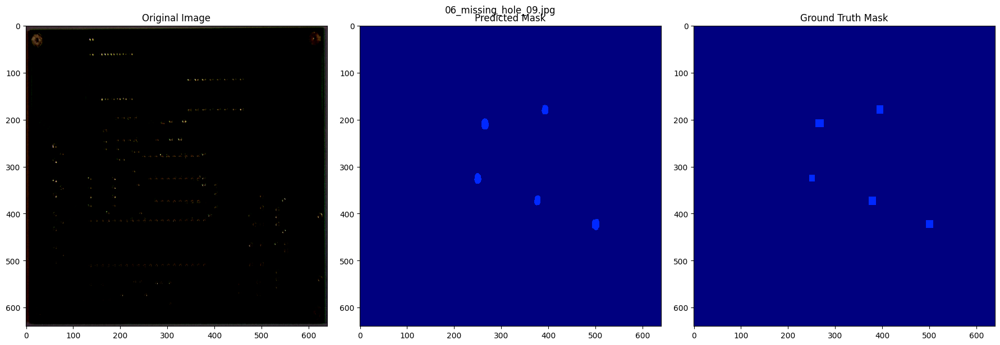


Image: 05_missing_hole_05.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


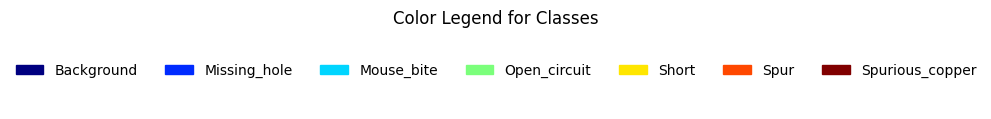

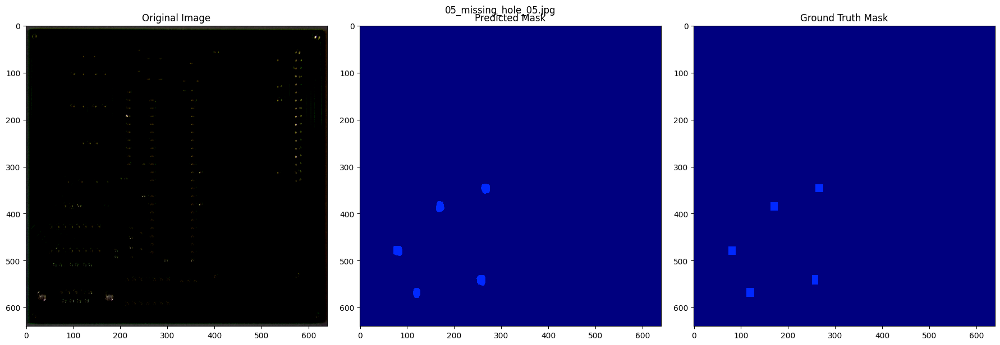

 74%|███████▍  | 20/27 [01:08<00:24,  3.45s/it]


Image: 11_missing_hole_07.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


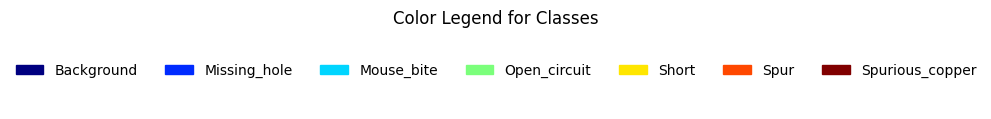

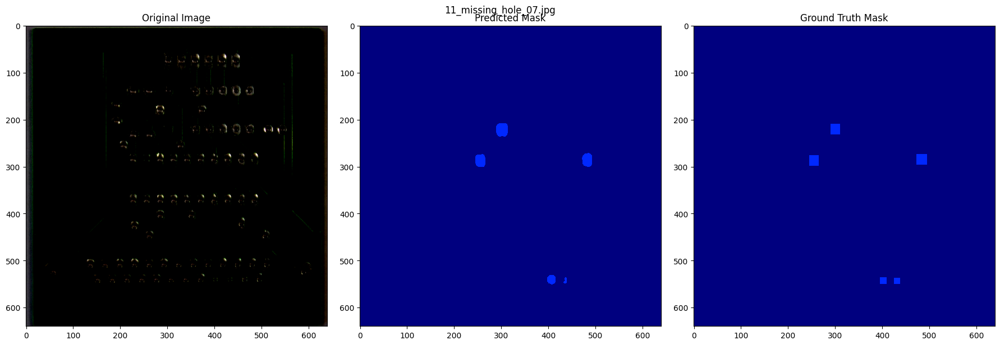


Image: 04_missing_hole_15.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


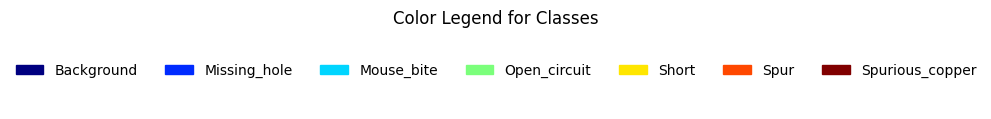

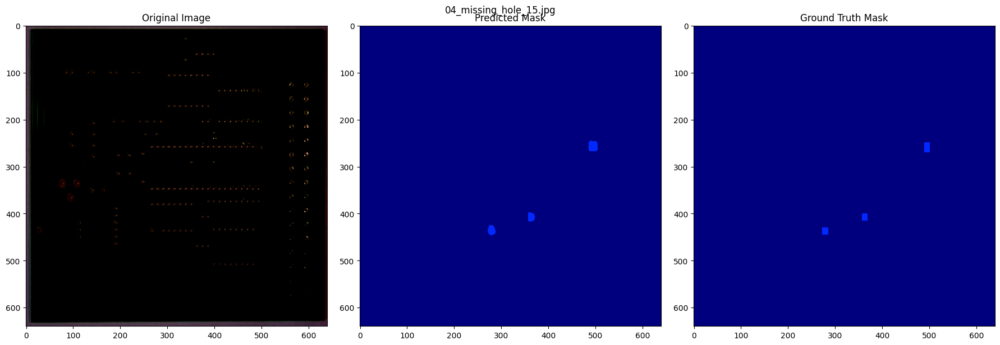


Image: 04_missing_hole_20.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


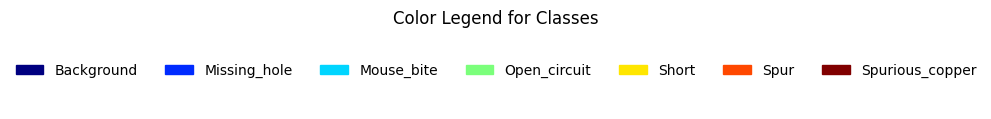

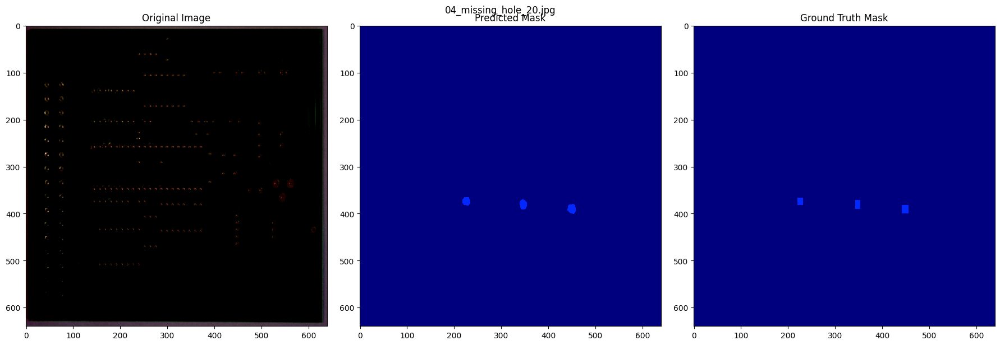


Image: 06_missing_hole_03.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


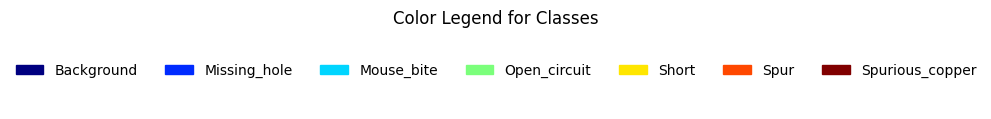

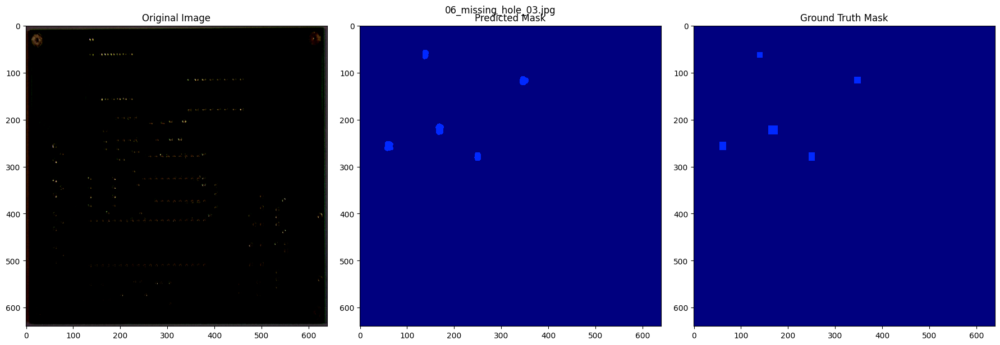

 78%|███████▊  | 21/27 [01:12<00:20,  3.43s/it]


Image: 09_missing_hole_06.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


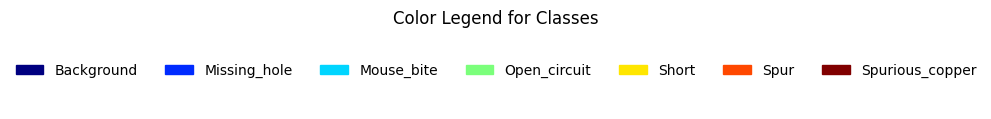

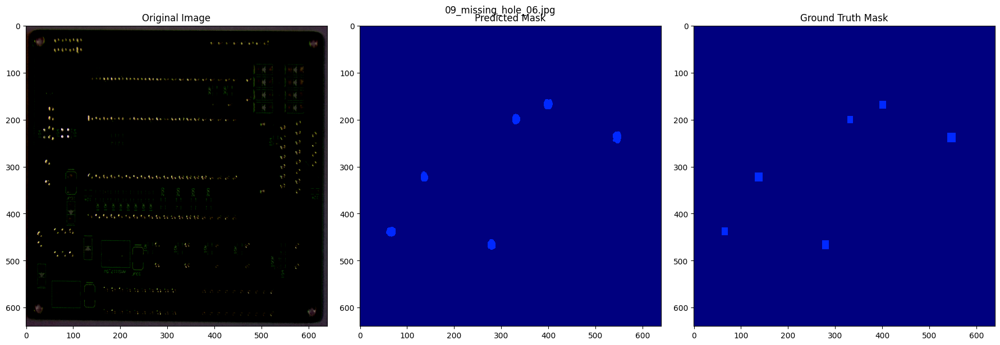


Image: 09_missing_hole_07.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


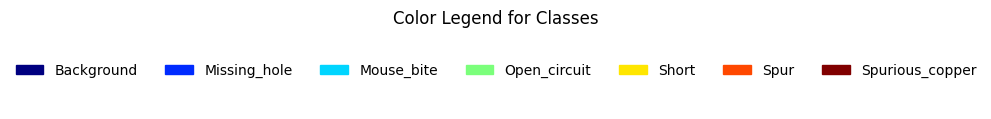

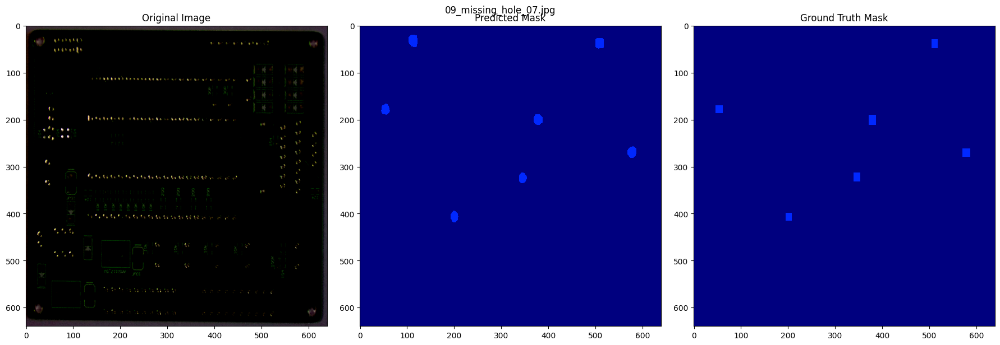


Image: 11_missing_hole_10.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


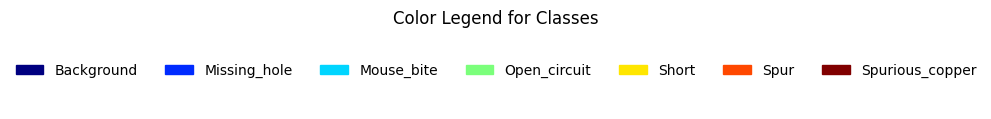

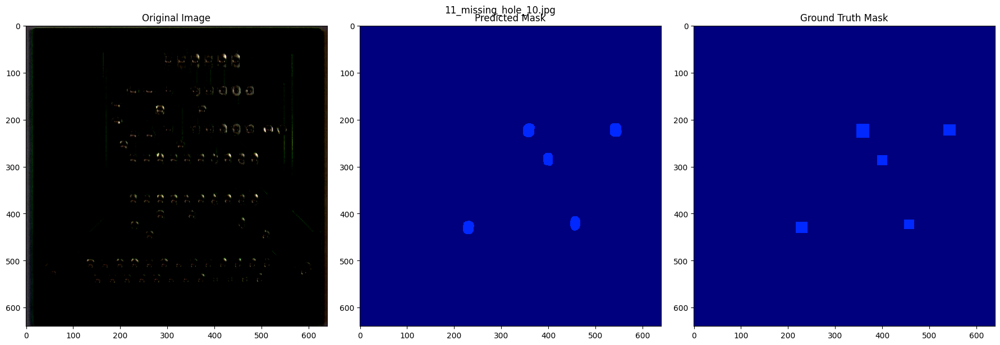


Image: 05_missing_hole_09.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


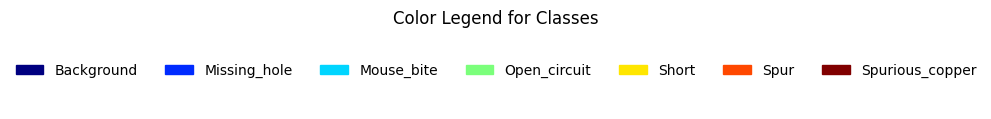

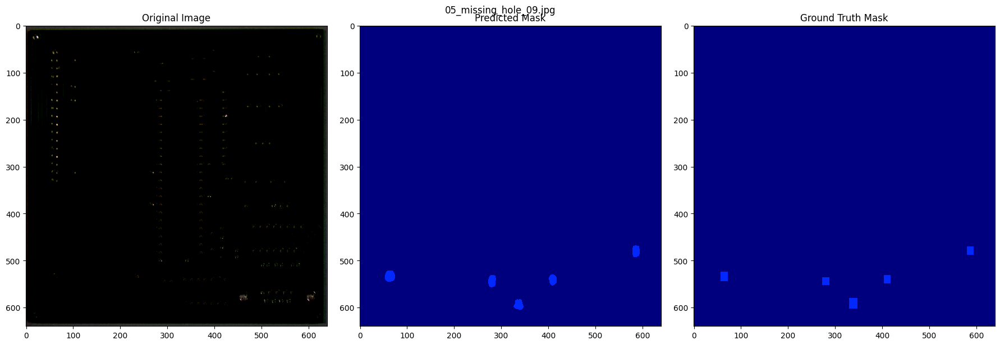

 81%|████████▏ | 22/27 [01:15<00:16,  3.40s/it]


Image: 12_missing_hole_06.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


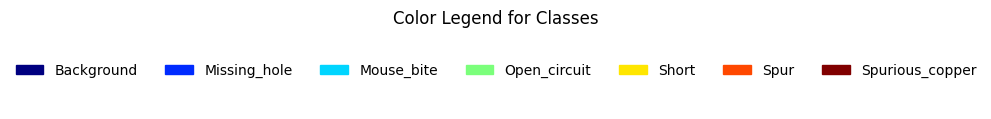

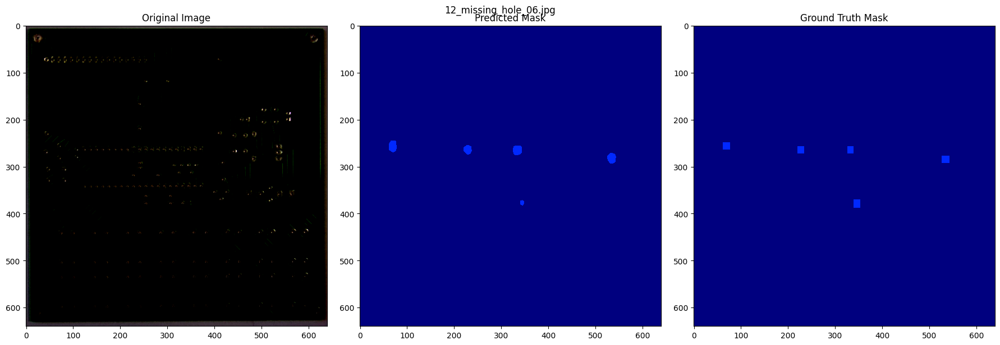


Image: 04_missing_hole_08.jpg
Ground Truth Mask - Unique values: [0 1]
Predicted Mask - Unique values   : [0 1]


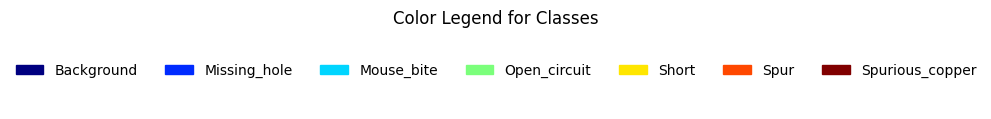

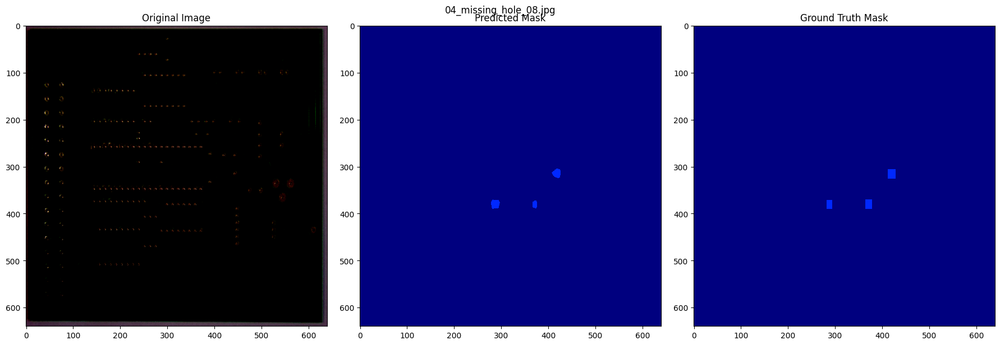


Image: 11_spurious_copper_03.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


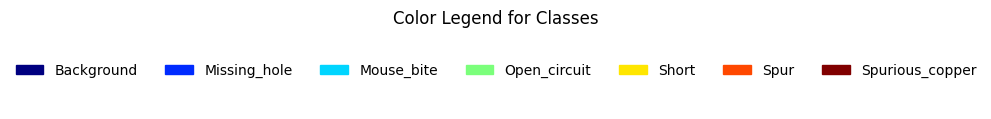

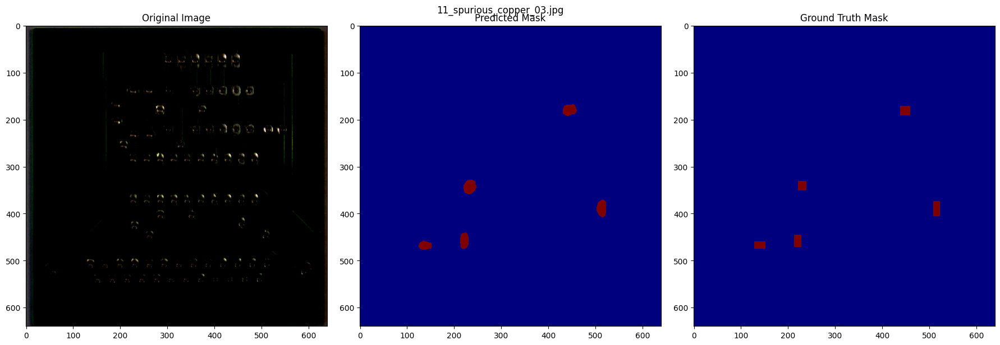


Image: 10_spurious_copper_02.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


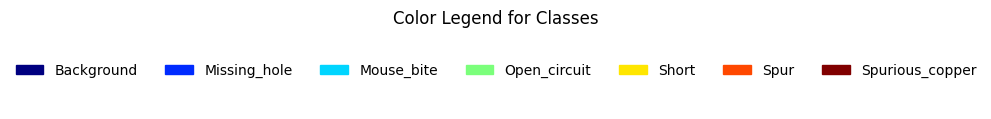

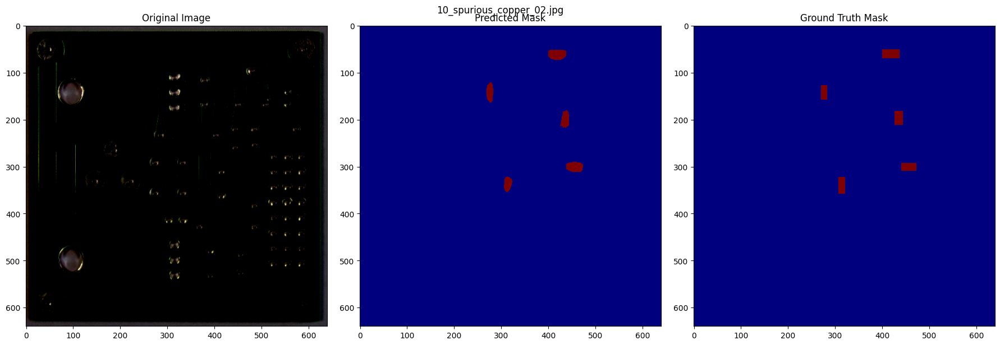

 85%|████████▌ | 23/27 [01:19<00:13,  3.45s/it]


Image: 08_spurious_copper_07.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 5 6]


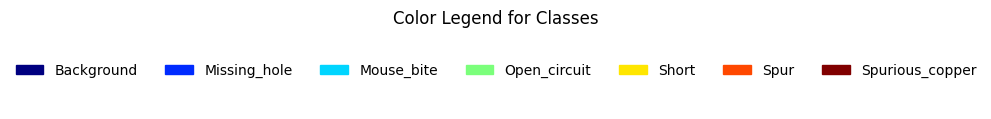

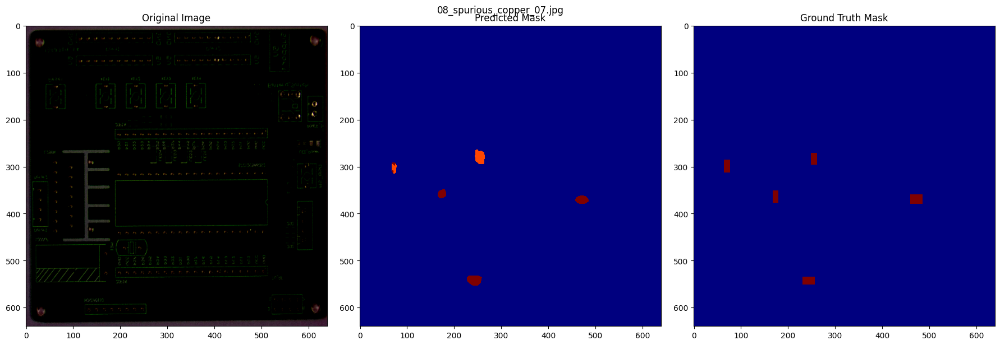


Image: 04_spurious_copper_17.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


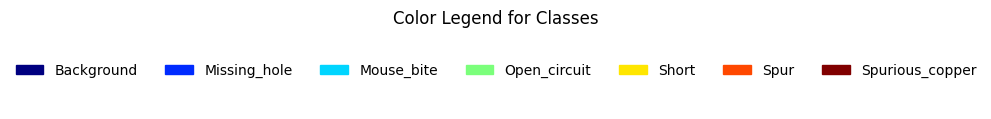

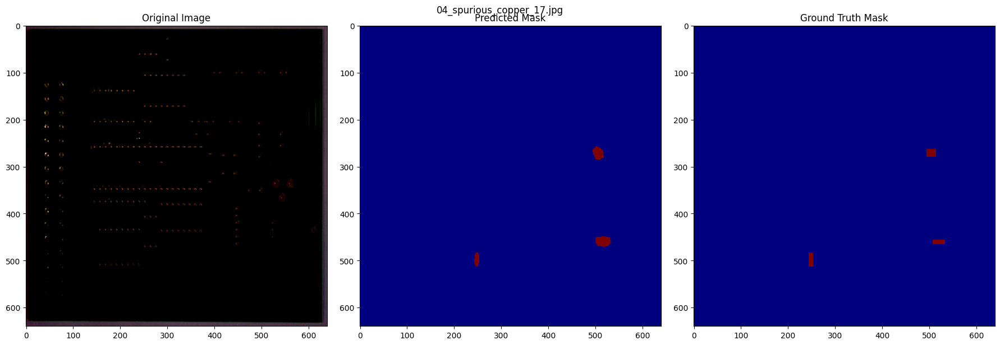


Image: 06_spurious_copper_07.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


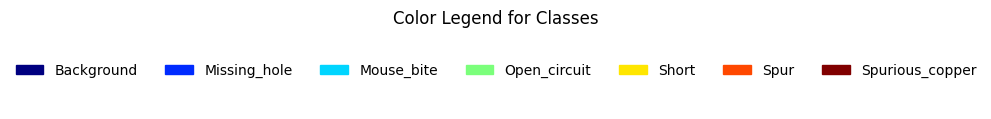

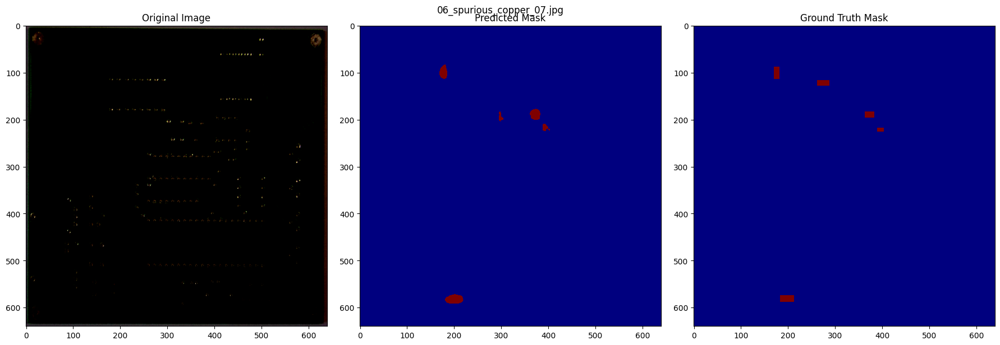


Image: 12_spurious_copper_01.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


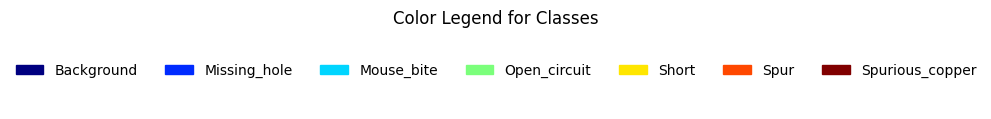

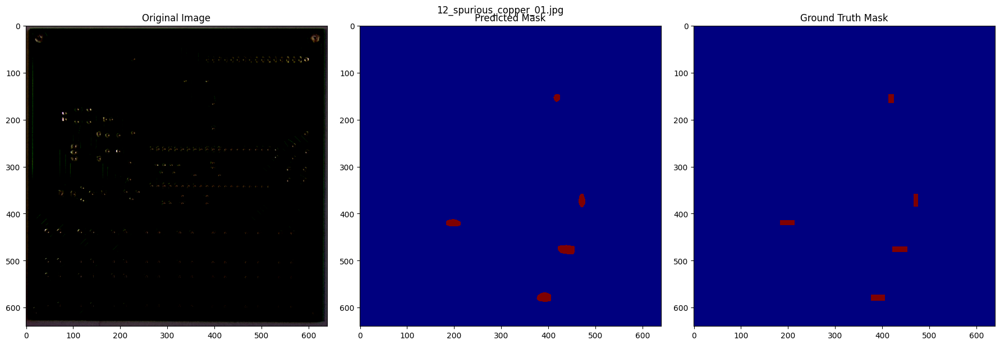

 89%|████████▉ | 24/27 [01:22<00:10,  3.44s/it]


Image: 01_spurious_copper_12.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


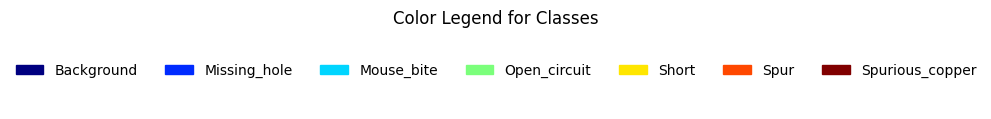

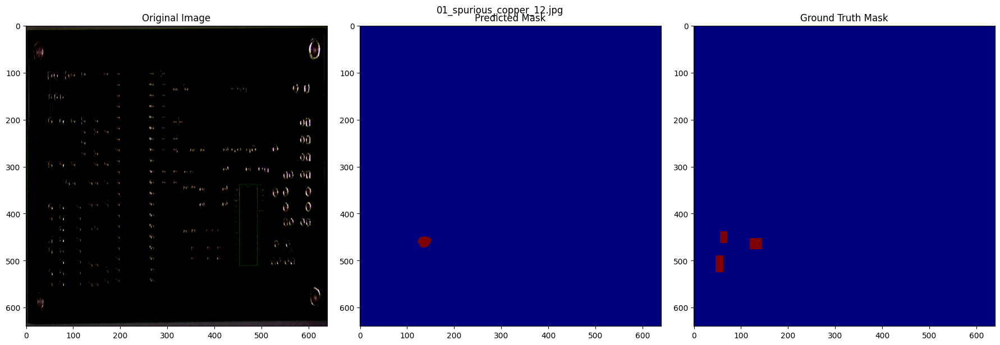


Image: 01_spurious_copper_17.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


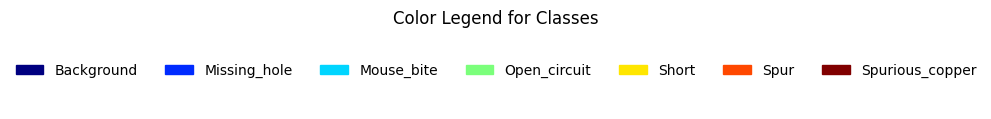

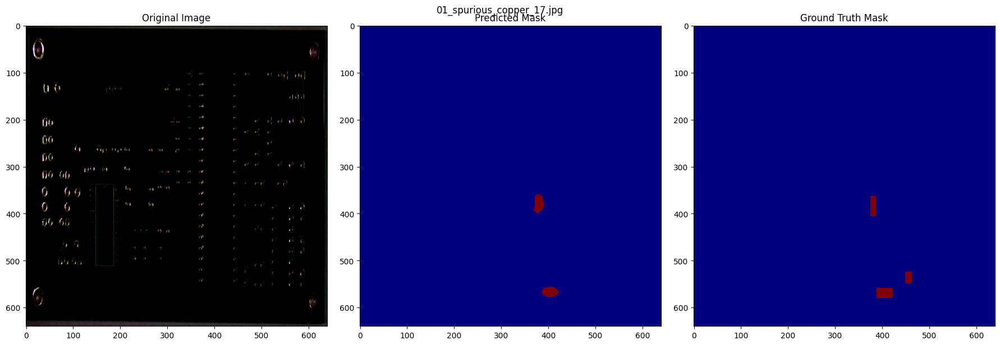


Image: 01_spurious_copper_13.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


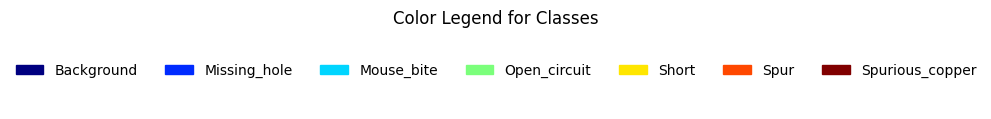

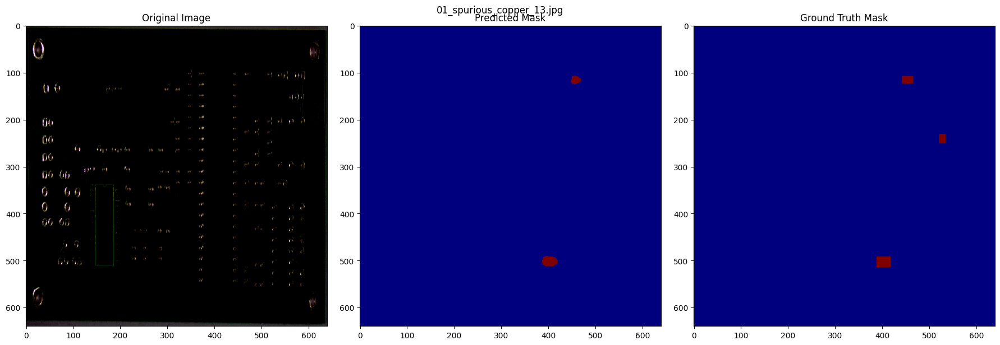


Image: 10_spurious_copper_01.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


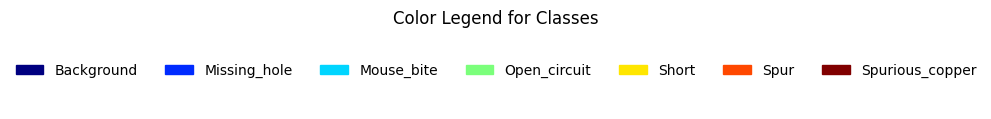

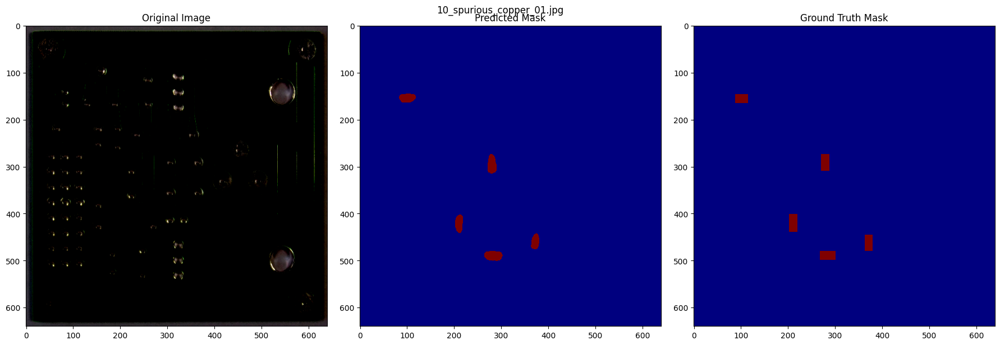

 93%|█████████▎| 25/27 [01:25<00:06,  3.39s/it]


Image: 06_spurious_copper_02.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


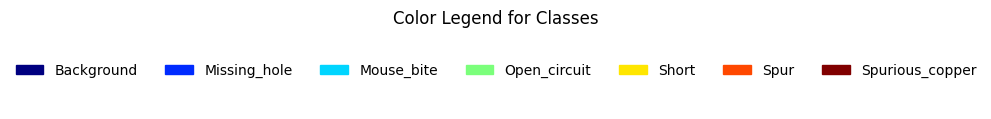

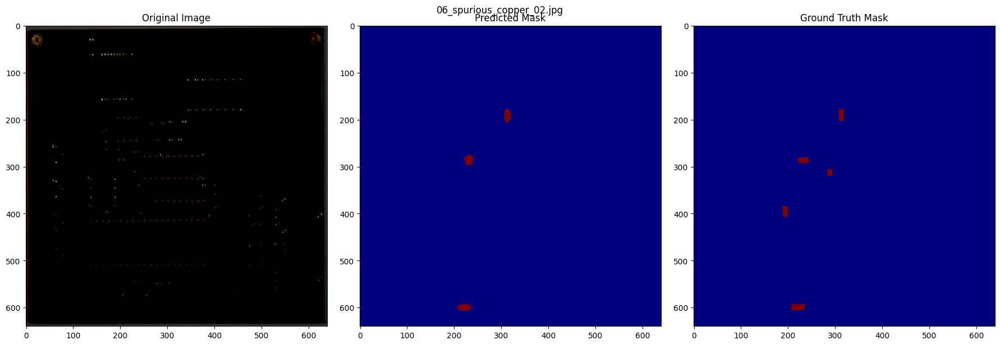


Image: 10_spurious_copper_05.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


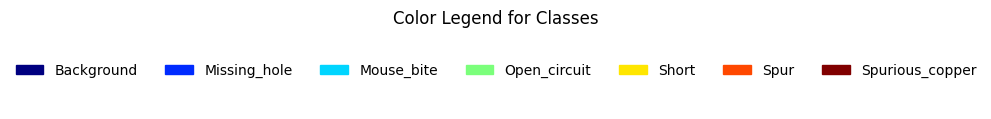

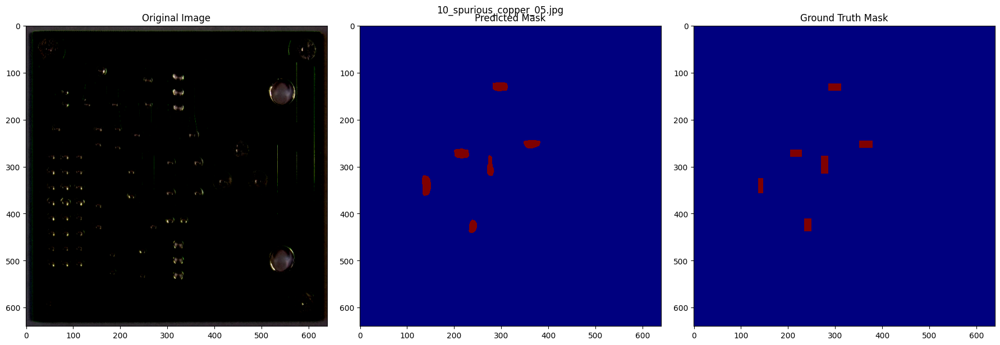


Image: 10_spurious_copper_04.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


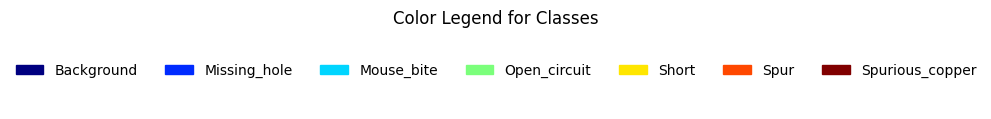

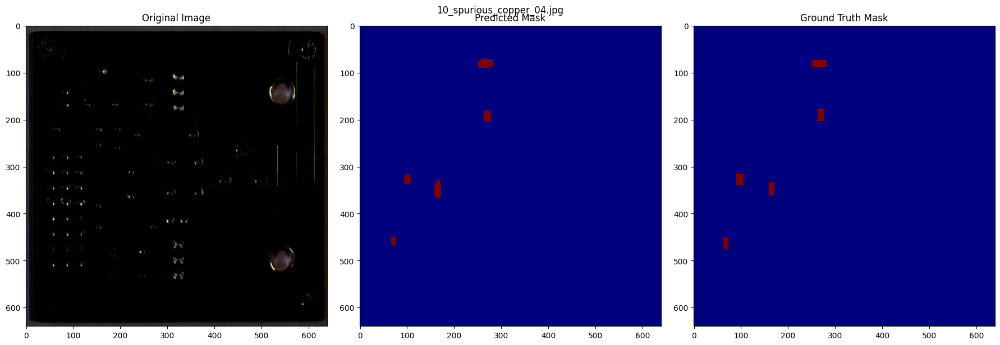


Image: 01_spurious_copper_14.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


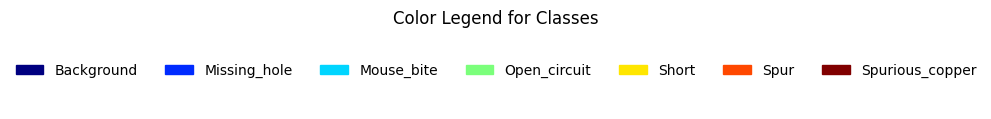

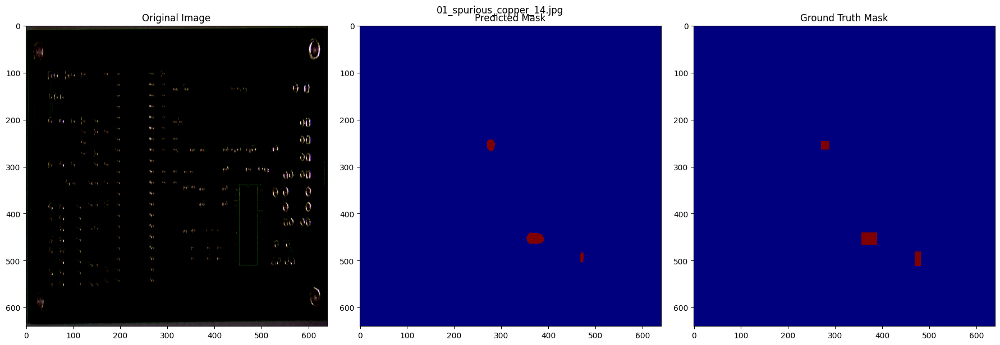

 96%|█████████▋| 26/27 [01:29<00:03,  3.44s/it]


Image: 09_spurious_copper_06.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


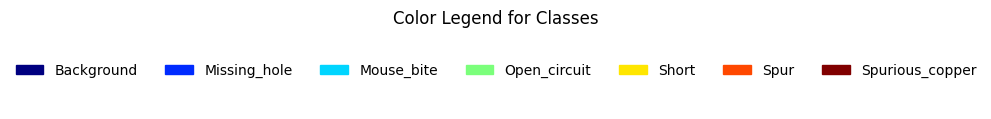

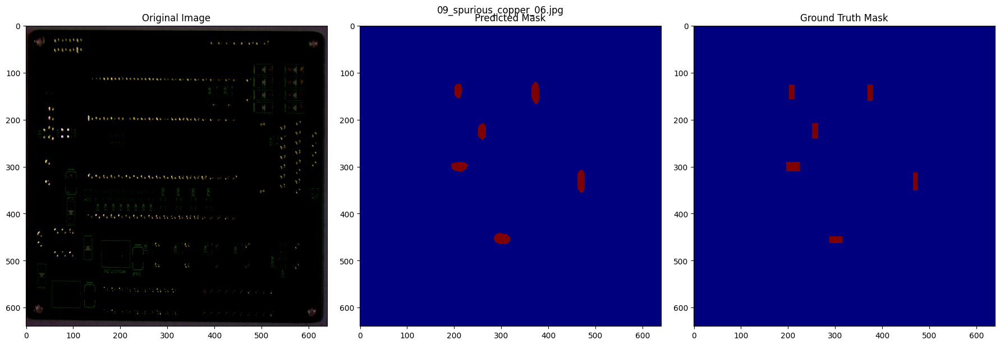


Image: 04_spurious_copper_13.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


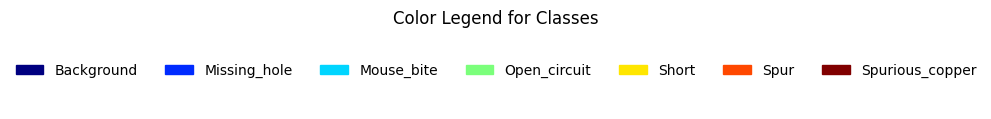

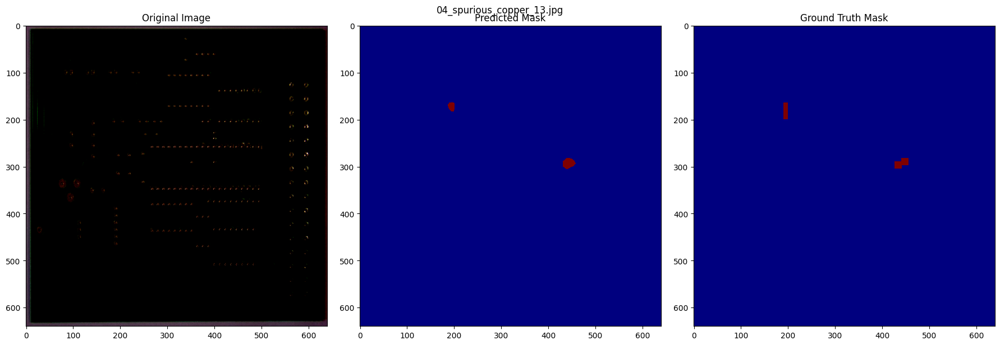


Image: 04_spurious_copper_18.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


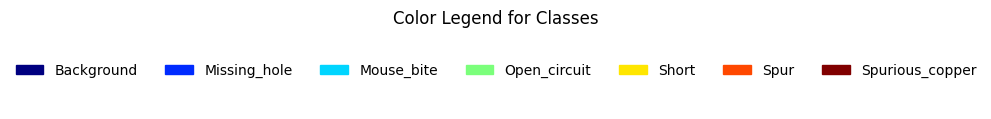

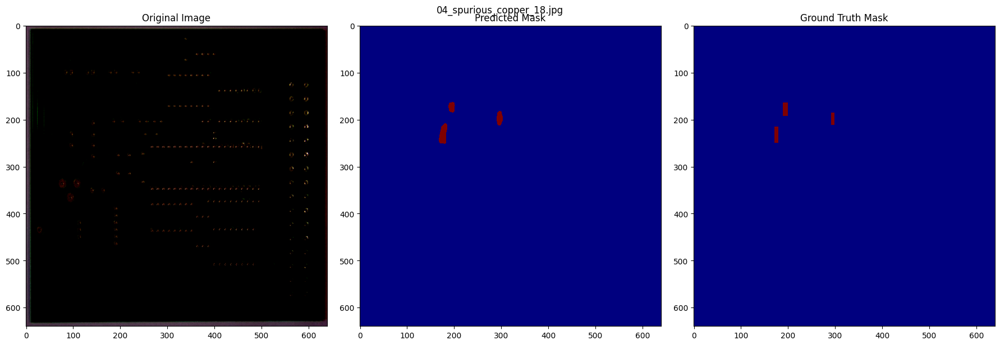


Image: 01_spurious_copper_03.jpg
Ground Truth Mask - Unique values: [0 6]
Predicted Mask - Unique values   : [0 6]


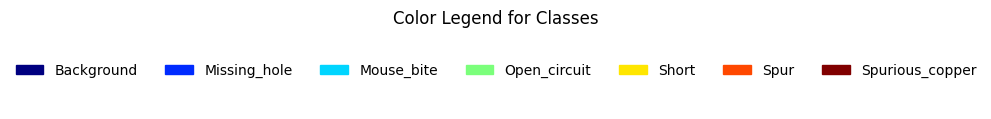

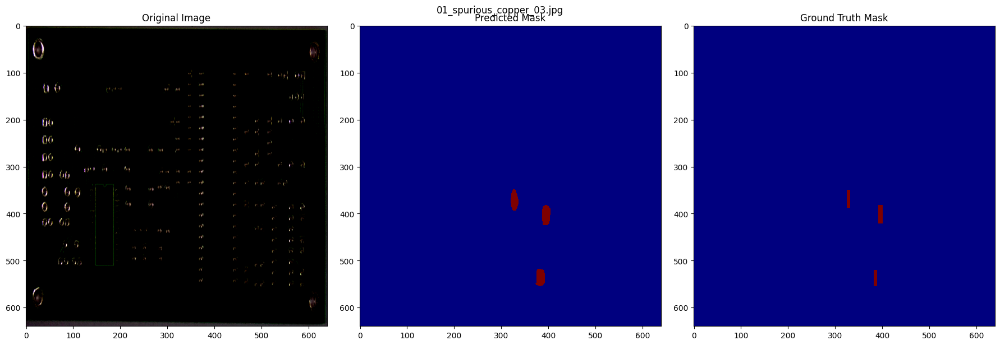

100%|██████████| 27/27 [01:32<00:00,  3.44s/it]



All tested image filenames:
1: 12_mouse_bite_06.jpg
2: 09_mouse_bite_10.jpg
3: 05_mouse_bite_07.jpg
4: 06_mouse_bite_02.jpg
5: 07_mouse_bite_03.jpg
6: 08_mouse_bite_03.jpg
7: 11_mouse_bite_06.jpg
8: 01_mouse_bite_12.jpg
9: 01_mouse_bite_02.jpg
10: 01_mouse_bite_04.jpg
11: 01_mouse_bite_17.jpg
12: 04_mouse_bite_10.jpg
13: 01_mouse_bite_15.jpg
14: 06_mouse_bite_07.jpg
15: 04_mouse_bite_13.jpg
16: 01_mouse_bite_01.jpg
17: 04_mouse_bite_09.jpg
18: 04_mouse_bite_19.jpg
19: 08_spur_01.jpg
20: 04_spur_04.jpg
21: 04_spur_05.jpg
22: 04_spur_13.jpg
23: 01_spur_03.jpg
24: 08_spur_08.jpg
25: 10_spur_04.jpg
26: 04_spur_07.jpg
27: 10_spur_02.jpg
28: 11_spur_06.jpg
29: 06_spur_09.jpg
30: 08_spur_09.jpg
31: 09_spur_04.jpg
32: 07_spur_08.jpg
33: 01_spur_13.jpg
34: 06_spur_04.jpg
35: 01_spur_14.jpg
36: 06_spur_10.jpg
37: 10_open_circuit_04.jpg
38: 11_open_circuit_06.jpg
39: 07_open_circuit_06.jpg
40: 07_open_circuit_04.jpg
41: 04_open_circuit_11.jpg
42: 06_open_circuit_01.jpg
43: 01_open_circuit_02.jpg

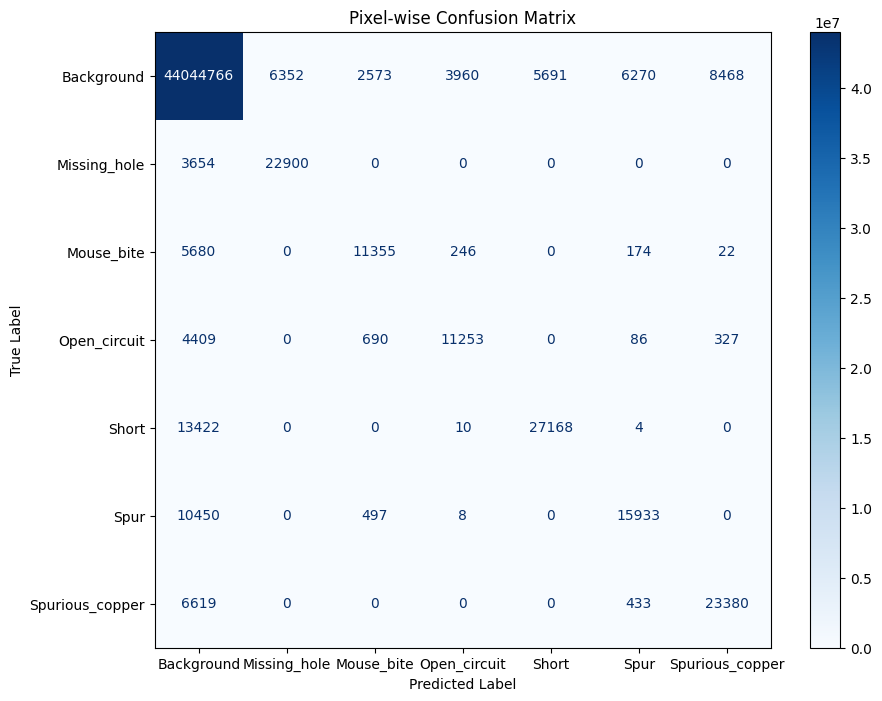

In [10]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import os

# Class names
class_names = {
    0: "Background",
    1: "Missing_hole",
    2: "Mouse_bite",
    3: "Open_circuit",
    4: "Short",
    5: "Spur",
    6: "Spurious_copper"
}

# Color legend function
def show_color_legend():
    colors = plt.cm.get_cmap('jet', len(class_names))
    handles = [mpatches.Patch(color=colors(i), label=class_names[i]) for i in class_names]
    plt.figure(figsize=(8, 1))
    plt.legend(handles=handles, loc='center', ncol=len(class_names), frameon=False)
    plt.title("Color Legend for Classes")
    plt.axis('off')
    plt.show()

# Prediction visualizer
def visualize_predictions(original, predicted, ground_truth, title="Sample"):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(original)
    axs[0].set_title("Original Image")

    axs[1].imshow(predicted, cmap='jet', interpolation='nearest', vmin=0, vmax=len(class_names)-1)
    axs[1].set_title("Predicted Mask")

    axs[2].imshow(ground_truth, cmap='jet', interpolation='nearest', vmin=0, vmax=len(class_names)-1)
    axs[2].set_title("Ground Truth Mask")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Accumulate predictions and labels
all_preds = []
all_labels = []
tested_filenames = []

with torch.no_grad():
    for images, masks, img_paths in tqdm(test_loader):
        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        all_preds.append(preds.cpu().numpy().flatten())
        all_labels.append(masks.cpu().numpy().flatten())

        for i in range(images.size(0)):
            orig = images[i].cpu().permute(1, 2, 0).numpy()
            pred = preds[i].cpu().numpy()
            gt = masks[i].cpu().numpy()
            fname = os.path.basename(img_paths[i])

            tested_filenames.append(fname)
            print(f"\nImage: {fname}")
            print("Ground Truth Mask - Unique values:", np.unique(gt))
            print("Predicted Mask - Unique values   :", np.unique(pred))
            show_color_legend()
            visualize_predictions(orig, pred, gt, fname)

# Print all tested filenames
print("\nAll tested image filenames:")
for i, fname in enumerate(tested_filenames):
    print(f"{i+1}: {fname}")

# Final Confusion Matrix
print("\nGenerating confusion matrix for all predicted pixels...")
all_preds_np = np.concatenate(all_preds)
all_labels_np = np.concatenate(all_labels)

cm = confusion_matrix(all_labels_np, all_preds_np, labels=list(class_names.keys()))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(class_names.values()))

fig, ax = plt.subplots(figsize=(10, 8))
disp.plot(cmap=plt.cm.Blues, ax=ax, values_format='d')
plt.title("Pixel-wise Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


In [11]:
from sklearn.metrics import classification_report

# Classification Report for each class
report = classification_report(
    all_labels_np,
    all_preds_np,
    labels=list(class_names.keys()),
    target_names=list(class_names.values()),
    digits=4,  
    zero_division=0  
)

print("\nClassification Report (per class):")
print(report)



Classification Report (per class):
                 precision    recall  f1-score   support

     Background     0.9990    0.9992    0.9991  44078080
   Missing_hole     0.7829    0.8624    0.8207     26554
     Mouse_bite     0.7512    0.6497    0.6968     17477
   Open_circuit     0.7271    0.6712    0.6980     16765
          Short     0.8268    0.6691    0.7396     40604
           Spur     0.6958    0.5926    0.6400     26888
Spurious_copper     0.7262    0.7683    0.7466     30432

       accuracy                         0.9982  44236800
      macro avg     0.7870    0.7446    0.7630  44236800
   weighted avg     0.9981    0.9982    0.9981  44236800

